In [1]:
#libraries
import pandas as pd
import datetime
from datetime import datetime
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Markdown as md
sns.set()

In [2]:
#styles for graphs
def styles():
    sns.set();
    sns.set(font_scale=1.5);
    #plot size
    plt.figure(figsize=(16, 5)); 


In [3]:
#%pip install --upgrade pip

In [4]:
#ignore warnings
import warnings
warnings.filterwarnings('ignore') # We can suppress the warnings

In [5]:
# stop fuzzy charts
%config InlineBackend.figure_format = "retina"

In [6]:
#pip install pandas==1.5.0

In [7]:
#import pickle file
filename ='../data/data.pkl'
infile = open(filename,'rb')
df = pickle.load(infile)

In [8]:
#view head
df.head(1)

,Datetime,Tweet ID,Text,Username,retweetCount,likeCount,hashtags
0,2021-10-22 10:08:21+00:00,1451490603766886402,Missed our recent webinar with partners Social...,AdviceGov,0,0,"['SocialValue', 'Gov', 'Procurement', 'PublicS..."


## Feature enginnering 

In [9]:
#feature engineering date, month, year, week, day of year, day of week, 
df['Datetime'] = pd.to_datetime(df['Datetime'])
df['Date'] = pd.to_datetime(df['Datetime']).dt.date
df['Month'] = pd.to_datetime(df['Date']).dt.month
df['Year'] = pd.to_datetime(df['Date']).dt.year
df['Week'] = pd.to_datetime(df['Date']).dt.week
df['day_of_year'] = pd.to_datetime(df['Date']).dt.dayofyear
df['day_of_week'] = pd.to_datetime(df['Date']).dt.dayofweek
df['quarter'] = pd.to_datetime(df['Date']).dt.quarter
df['season'] = df['Month']%12 // 3 + 1

In [10]:
df.dtypes

Datetime        datetime64[ns, UTC]
Tweet ID                     object
Text                         object
Username                     object
retweetCount                  int64
likeCount                     int64
hashtags                     object
Date                         object
Month                         int64
Year                          int64
Week                          int64
day_of_year                   int64
day_of_week                   int64
quarter                       int64
season                        int64
dtype: object

In [11]:
df[['Date', 'Month','day_of_year', 'quarter','season']].head(2)

,Date,Month,day_of_year,quarter,season
0,2021-10-22,10,295,4,4
1,2021-10-26,10,299,4,4


In [12]:
#get the word count of the tweet
df["word_count"] = df["Text"].apply(lambda x: len(str(x).split()))

In [13]:
#get the word count of the tweet
df["char_count"] = df["Text"].str.len()

In [14]:
#https://www.nltk.org/
import nltk #natural langugage toolkit

In [15]:
#download stopwords
nltk.download("stopwords")

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/ritaraher/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [16]:
from nltk.corpus import stopwords
#remove stopwords
stop = stopwords.words("english")

In [17]:
# counting stop words
#stop words
df["stopwords"]= df["Text"].apply(lambda x: len([x for x in x.split() if x in stop]))

In [18]:
#count hashtags
df["hashtag_count"]= df["Text"].apply(lambda x: len([x for x in x.split() if x.startswith('#')]))

In [19]:
# Apply text cleaning techniques
import re
import string

def clean_text_round1(text):
    text = text.lower()                                              #convert to lowercase
    text = re.sub('\[.*?\]', '', text)                               #remove the twitter handle
    text = re.sub('@[^\s]+', '', text)                               # remove text in square brackets
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)  # remove punctuation
    text = re.sub('\w*\d\w*', '', text)                              #remove words containing numbers
    text = re.sub('\n', '', text)                                    # remove \n
    return text

round1 = lambda x: clean_text_round1(x)

In [20]:
# Let's take a look at the updated text
df['tweet_clean'] = df.Text.apply(round1)

In [21]:
#removing stop words from tweet clean
df["tweet_clean"]= df["tweet_clean"].apply(lambda x : " ".join(x for x in x.split() if x not in stop))

### Sentiment feature engineering 

In [22]:
#pip install TextBlob

In [23]:
#pip install vaderSentiment

In [24]:
##semantic analysis
from textblob import TextBlob
df["tweet_clean"][:5].apply(lambda x : TextBlob(x).sentiment)

#   (-0.5, 1.0)
# break into polarity
df["polarity"]= df["tweet_clean"].apply(lambda x : TextBlob(x).sentiment[0])

df["subjectivity"]= df["tweet_clean"].apply(lambda x : TextBlob(x).sentiment[1])

In [25]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()

In [26]:
df['sentiments_new'] = df['tweet_clean'].apply(lambda x: analyzer.polarity_scores(' '.join(re.findall(r'\w+',x.lower()))))

df['Positive Sentiment']   = df['sentiments_new'].apply(lambda x: x['pos']) 
df['Neutral Sentiment']    = df['sentiments_new'].apply(lambda x: x['neu'])
df['Negative Sentiment']   = df['sentiments_new'].apply(lambda x: x['neg'])
df['compound']   = df['sentiments_new'].apply(lambda x: x['compound'])
#df['sentiments_new']
df.drop(columns=['sentiments_new'],inplace=True)

In [27]:
df.head(1)

,Datetime,Tweet ID,Text,Username,retweetCount,likeCount,hashtags,Date,Month,Year,...,char_count,stopwords,hashtag_count,tweet_clean,polarity,subjectivity,Positive Sentiment,Neutral Sentiment,Negative Sentiment,compound
0,2021-10-22 10:08:21+00:00,1451490603766886402,Missed our recent webinar with partners Social...,AdviceGov,0,0,"['SocialValue', 'Gov', 'Procurement', 'PublicS...",2021-10-22,10,2021,...,251,10,5,missed recent webinar partners social value bu...,0.141667,0.220833,0.297,0.618,0.085,0.6705


In [28]:
df.describe()

,retweetCount,likeCount,Month,Year,Week,day_of_year,day_of_week,quarter,season,word_count,char_count,stopwords,hashtag_count,polarity,subjectivity,Positive Sentiment,Neutral Sentiment,Negative Sentiment,compound
count,18481.000000,18481.000000,18481.000000,18481.000000,18481.000000,18481.000000,18481.000000,18481.000000,18481.000000,18481.000000,18481.000000,18481.000000,18481.000000,18481.000000,18481.000000,18481.000000,18481.000000,18481.000000,18481.000000
mean,1.464152,5.331854,6.509063,2021.808939,26.464748,182.473459,2.998755,2.506737,2.507007,30.891510,202.246036,10.516530,0.653861,0.026828,0.372424,0.147777,0.706814,0.144268,0.006150
std,14.987499,59.127954,3.440753,0.393148,14.977832,105.126870,1.996439,1.117487,1.112730,17.170862,125.516460,6.773457,1.664155,0.274880,0.301225,0.166641,0.210051,0.174274,0.487079
min,0.000000,0.000000,1.000000,2021.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,4.000000,0.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,-0.985600
25%,0.000000,0.000000,4.000000,2022.000000,13.000000,91.000000,1.000000,2.000000,2.000000,16.000000,104.000000,5.000000,0.000000,-0.050000,0.000000,0.000000,0.579000,0.000000,-0.401900
50%,0.000000,0.000000,7.000000,2022.000000,26.000000,182.000000,3.000000,3.000000,3.000000,32.000000,205.000000,10.000000,0.000000,0.000000,0.383333,0.113000,0.714000,0.100000,0.000000
75%,0.000000,2.000000,10.000000,2022.000000,40.000000,274.000000,5.000000,4.000000,3.000000,45.000000,284.000000,16.000000,0.000000,0.150000,0.593750,0.236000,0.855000,0.231000,0.401900
max,1317.000000,5818.000000,12.000000,2022.000000,52.000000,365.000000,6.000000,4.000000,4.000000,108.000000,1005.000000,33.000000,26.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.969400


we have 18,481 tweets which an average word count of 30, average of 1 reweet and 5 likes. 

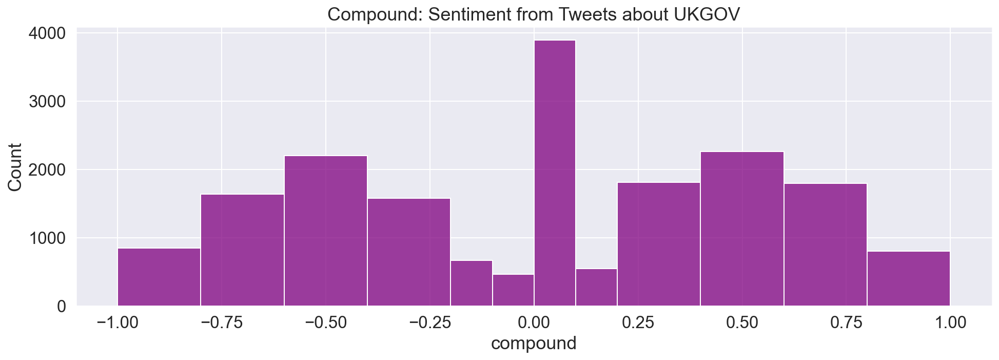

In [29]:
#call styles for plots
styles();

#histogram for polarity
sns.histplot(data=df, x="compound", bins=[-1,-0.8, -0.6, -0.4, -0.2,-0.1, 0, 0.1, 0.2, 0.4, 0.6, 0.8,1], color="purple");

plt.title("Compound: Sentiment from Tweets about UKGOV");
plt.show();

There is a lot of sentiment which is neutral. 

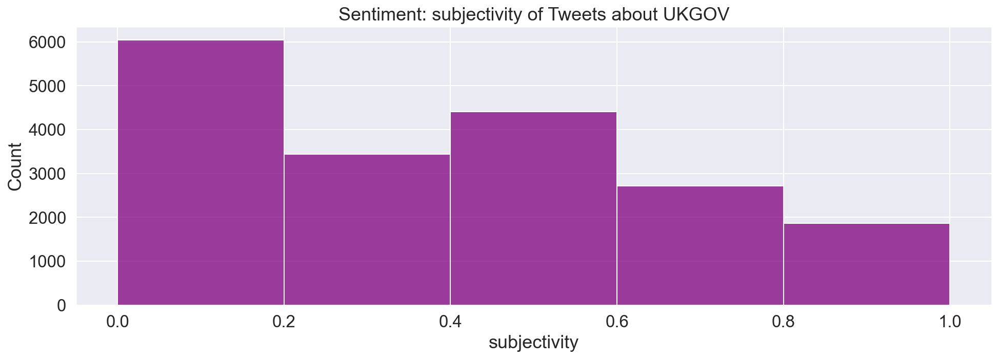

In [30]:
#call styles for plots
styles();

#histogram for polarity
sns.histplot(data=df, x="subjectivity", bins=[0, 0.2, 0.4, 0.6,0.8, 1], color="purple");

plt.title("Sentiment: subjectivity of Tweets about UKGOV");

plt.show();

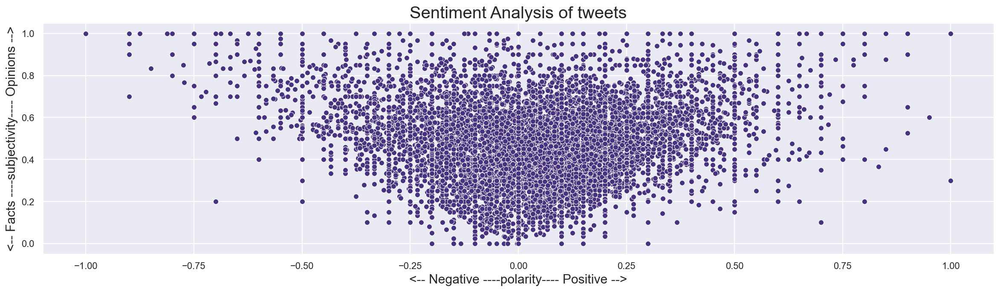

In [31]:
#set to seaborn
sns.set()
#palette="viridis"
sns.set_palette('viridis');
#plot size
plt.figure(figsize=(20, 5));  

sns.scatterplot(data=df, x="polarity", y="subjectivity")

plt.title("Sentiment Analysis of tweets", fontsize=20);
plt.xlabel('<-- Negative ----polarity---- Positive -->', fontsize=15);
plt.ylabel('<-- Facts ----subjectivity---- Opinions -->', fontsize=15);

plt.show();

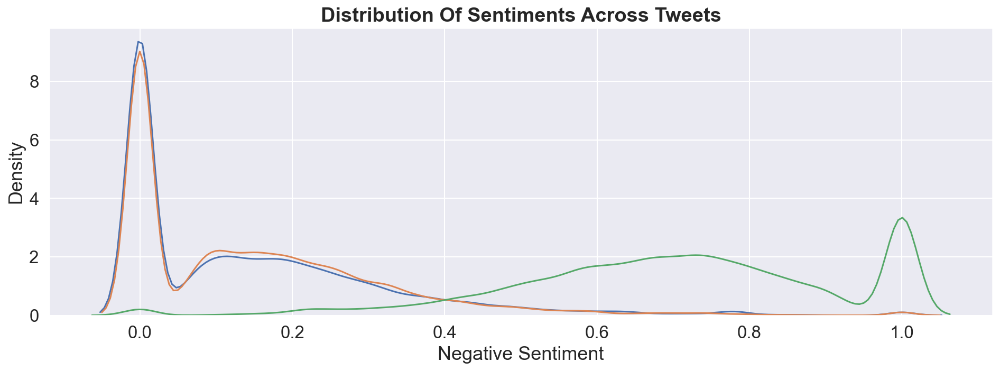

In [32]:
#call styles for plots
styles();

plt.title('Distribution Of Sentiments Across Tweets',fontsize=19,fontweight='bold');
sns.kdeplot(df['Negative Sentiment'],bw=0.1);
sns.kdeplot(df['Positive Sentiment'],bw=0.1);
sns.kdeplot(df['Neutral Sentiment'],bw=0.1);

<AxesSubplot:xlabel='Date', ylabel='Positive Sentiment'>

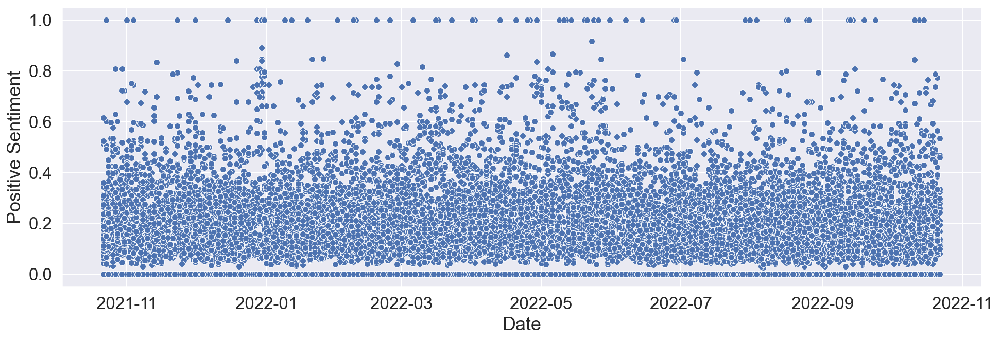

In [33]:
styles();
sns.scatterplot(x=df['Date'], y=df['Positive Sentiment'])

In [34]:
#pip install wordcloud

In [35]:
##Wordcloud Modules
from wordcloud import WordCloud 

In [36]:
def wc(data,bgcolor): # word cloud
    plt.figure(figsize=(10,10))
    wc=WordCloud(background_color=bgcolor,max_words=100, min_word_length=4, contour_width=3, contour_color='viridis')
    wc.generate(" ".join(data)) 
    plt.imshow(wc)
    plt.axis("off")

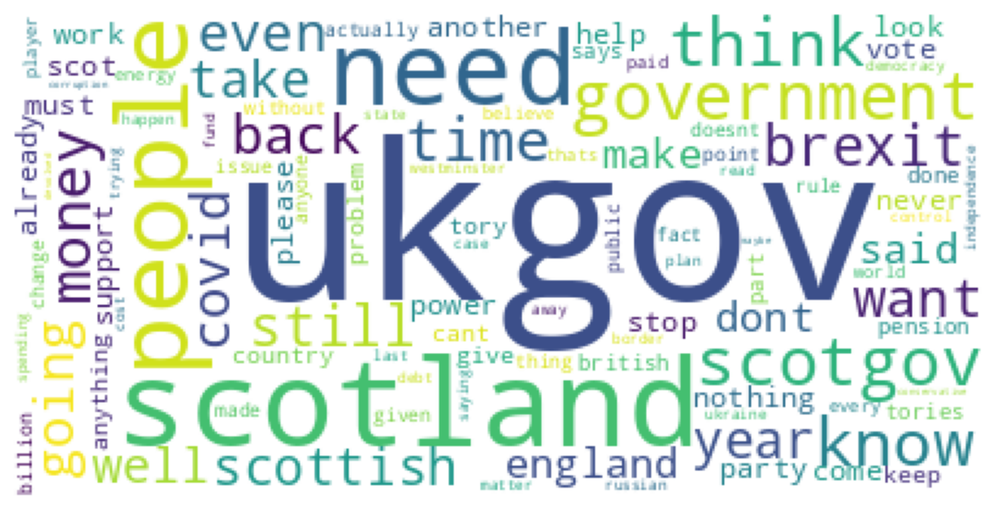

In [37]:
# neutral sentiment wordcloud
wc(df[df.polarity==0.0].tweet_clean, 'white')

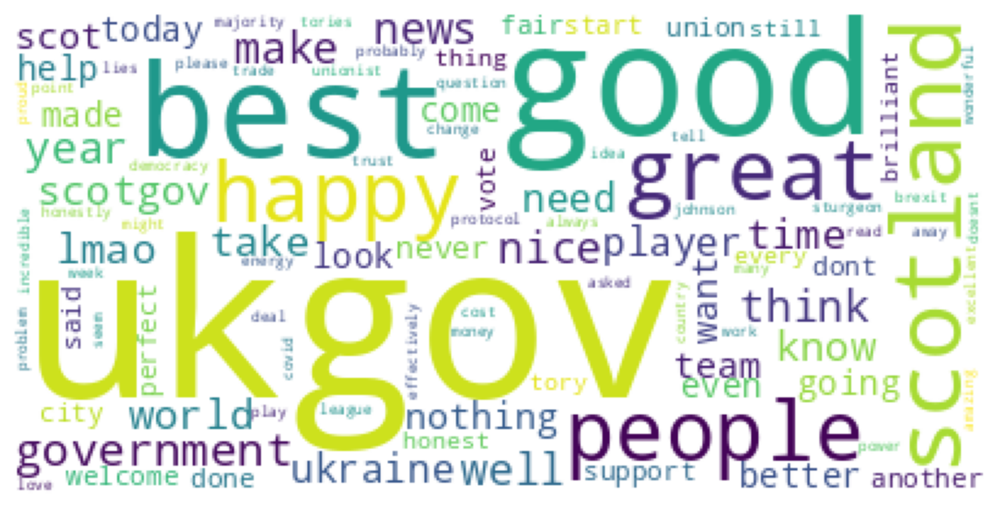

In [38]:
# positive sentiment wordcloud
wc(df[df.polarity>.55].tweet_clean, 'white')

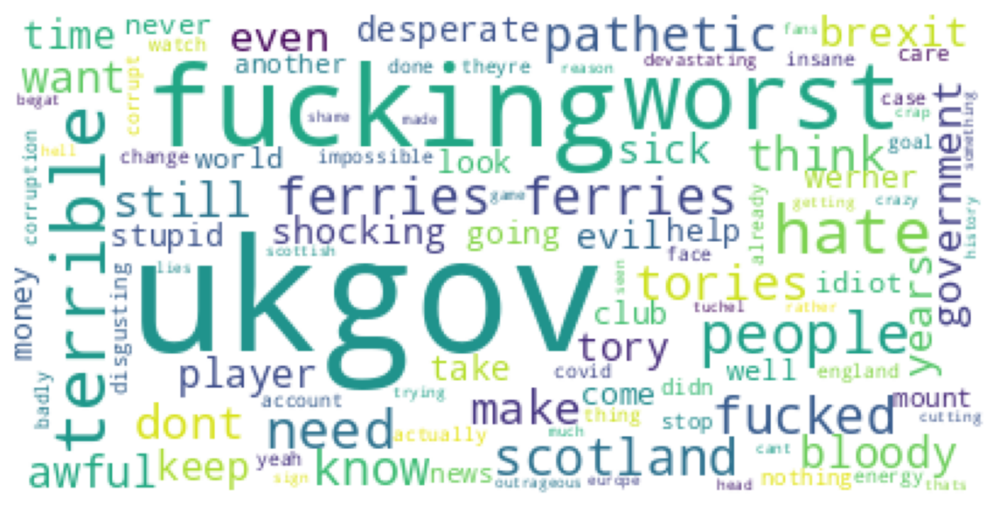

In [39]:
# negative sentiment wordcloud
wc(df[df.polarity<-.55].tweet_clean, 'white')

# Dropping tweets with compound of zero

In [40]:
data_df = df.query('compound >= 0.2 and compound <= -0.1')

#df.drop(df[(df.score < 50) & (df.score > 20)].index)

In [41]:
filtered_df = df.query('compound != 0')

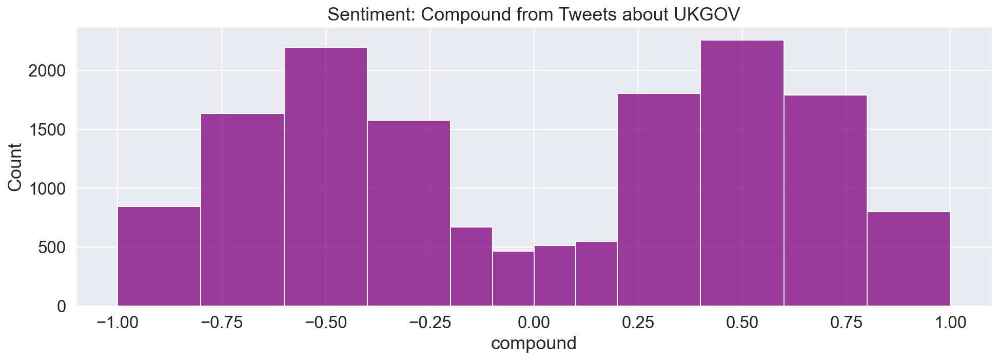

In [42]:
#call styles for plots
styles();

#histogram for polarity
sns.histplot(data=filtered_df, x="compound", bins=[-1,-0.8, -0.6, -0.4, -0.2,-0.1, 0, 0.1, 0.2, 0.4, 0.6, 0.8,1], color="purple");

plt.title("Sentiment: Compound from Tweets about UKGOV");
plt.show();

## Save for later

In [43]:
data_file = '../dashboard/df_full.pkl'
pickle.dump(filtered_df, open(data_file, 'wb'))

# Document term matrix

In [44]:
# We are going to create a document-term matrix using CountVectorizer, and exclude common English stop words

from sklearn.feature_extraction.text import CountVectorizer

# create a count vectorizer object
cv = CountVectorizer(stop_words="english")

# fit the count vectorizer using the text data
data_cv = cv.fit_transform(df['tweet_clean'])
data_dtm =pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names())

# Pickle it for later use
import pickle
pickle.dump(cv, open("../data/cv_stop.pkl", "wb"))

data_dtm

,aa,aampe,aanes,aare,aas,ab,aback,abandon,abandoned,abandoning,...,zoning,zoo,zoological,zoom,zoomers,zouma,zubair,ánd,çareally,پاکستانزندہباد
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18476,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
18477,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
18478,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
18479,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [45]:
#Gensism Python framework for fast Vector Space Modelling
from gensim import matutils, models
#ndustrial-strength Natural Language Processing (NLP) in Python
import scipy.sparse

## Topic modelling

In [46]:
# One of the required inputs is a term-document matrix
data_dtm = data_dtm.transpose()
data_dtm.head()

,0,1,2,3,4,5,6,7,8,9,...,18471,18472,18473,18474,18475,18476,18477,18478,18479,18480
aa,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
aampe,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
aanes,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
aare,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
aas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [86]:
# turn term matrix into a sparse matrix
sparse_counts = scipy.sparse.csr_matrix(data_dtm)
#Convert a Scipy.sparse vector into the Gensim bag-of-words format
corpus = matutils.Sparse2Corpus(sparse_counts)

In [87]:
# collect the vocabulary items used in the count vectorizer
id2word = dict((v, k) for k, v in cv.vocabulary_.items())

In [88]:
# Train the model on the corpus.
lda = models.LdaModel(corpus=corpus, id2word=id2word, num_topics=2, passes=10)
lda.print_topics()

[(0,
  '0.026*"ukgov" + 0.005*"like" + 0.004*"people" + 0.004*"amp" + 0.003*"got" + 0.003*"good" + 0.003*"shit" + 0.003*"fuck" + 0.003*"man" + 0.003*"need"'),
 (1,
  '0.055*"ukgov" + 0.012*"uk" + 0.011*"amp" + 0.009*"scotland" + 0.005*"people" + 0.004*"eu" + 0.004*"brexit" + 0.004*"scotgov" + 0.004*"money" + 0.003*"dont"')]

In [89]:
lda = models.LdaModel(corpus=corpus, id2word=id2word, num_topics=3, passes=10)
lda.print_topics()

[(0,
  '0.049*"ukgov" + 0.010*"amp" + 0.006*"uk" + 0.005*"scotland" + 0.005*"tory" + 0.004*"people" + 0.004*"nhs" + 0.003*"scottish" + 0.003*"british" + 0.003*"government"'),
 (1,
  '0.044*"ukgov" + 0.011*"uk" + 0.011*"scotland" + 0.005*"think" + 0.005*"like" + 0.005*"people" + 0.005*"amp" + 0.004*"scotgov" + 0.003*"dont" + 0.003*"don"'),
 (2,
  '0.045*"ukgov" + 0.012*"amp" + 0.008*"uk" + 0.005*"brexit" + 0.005*"tax" + 0.004*"people" + 0.004*"energy" + 0.004*"eu" + 0.004*"money" + 0.004*"like"')]

In [90]:
# LDA for num_topics = 4
lda = models.LdaModel(corpus=corpus, id2word=id2word, num_topics=4, passes=10)
lda.print_topics()

[(0,
  '0.020*"ukgov" + 0.005*"debt" + 0.004*"people" + 0.004*"like" + 0.004*"uk" + 0.004*"good" + 0.004*"amp" + 0.003*"british" + 0.003*"tests" + 0.003*"win"'),
 (1,
  '0.025*"ukgov" + 0.005*"like" + 0.004*"billion" + 0.004*"fuck" + 0.004*"fucking" + 0.004*"shit" + 0.004*"money" + 0.003*"play" + 0.003*"covid" + 0.003*"need"'),
 (2,
  '0.064*"ukgov" + 0.014*"uk" + 0.014*"amp" + 0.011*"scotland" + 0.007*"people" + 0.006*"eu" + 0.005*"brexit" + 0.005*"scotgov" + 0.004*"know" + 0.004*"dont"'),
 (3,
  '0.035*"ukgov" + 0.005*"amp" + 0.004*"russian" + 0.004*"ukraine" + 0.004*"uk" + 0.003*"russia" + 0.003*"johnson" + 0.003*"new" + 0.003*"government" + 0.003*"watch"')]

In [91]:
# LDA for num_topics = 5
lda = models.LdaModel(corpus=corpus, id2word=id2word, num_topics=5, passes=10)
lda.print_topics()

[(0,
  '0.067*"ukgov" + 0.012*"uk" + 0.011*"amp" + 0.010*"scotland" + 0.006*"people" + 0.005*"like" + 0.005*"think" + 0.005*"know" + 0.004*"scotgov" + 0.004*"eu"'),
 (1,
  '0.019*"ukgov" + 0.008*"like" + 0.007*"shit" + 0.005*"don" + 0.004*"man" + 0.004*"good" + 0.004*"city" + 0.004*"ve" + 0.004*"win" + 0.003*"game"'),
 (2,
  '0.011*"fuck" + 0.008*"fucking" + 0.006*"club" + 0.006*"play" + 0.005*"player" + 0.005*"mount" + 0.004*"united" + 0.004*"spends" + 0.003*"man" + 0.003*"terrible"'),
 (3,
  '0.045*"ukgov" + 0.009*"uk" + 0.008*"energy" + 0.008*"amp" + 0.007*"money" + 0.006*"scotland" + 0.004*"tax" + 0.004*"companies" + 0.004*"referendum" + 0.004*"pay"'),
 (4,
  '0.035*"ukgov" + 0.016*"amp" + 0.011*"uk" + 0.007*"people" + 0.007*"brexit" + 0.006*"eu" + 0.005*"border" + 0.003*"law" + 0.003*"refugees" + 0.003*"rights"')]

# Topic Modeling - Attempt #2 (Nouns Only)¶

In [299]:
# Let's create a function to pull out nouns from a string of text
from nltk import word_tokenize, pos_tag

def nouns(text):
    '''Given a string of text, tokenize the text and pull out only the nouns.'''
    is_noun = lambda pos: pos[:2] == 'NN'
    tokenized = word_tokenize(text)
    all_nouns = [word for (word, pos) in pos_tag(tokenized) if is_noun(pos)] 
    return ' '.join(all_nouns)

In [300]:
# Apply the nouns function to the transcripts to filter only on nouns
df['data_nouns'] = pd.DataFrame(df.tweet_clean.apply(nouns))
df.head(5)

,Datetime,Tweet ID,Text,Username,retweetCount,likeCount,hashtags,Date,Month,Year,...,stopwords,hashtag_count,tweet_clean,polarity,subjectivity,Positive Sentiment,Neutral Sentiment,Negative Sentiment,compound,data_nouns
0,2021-10-22 10:08:21+00:00,1451490603766886402,Missed our recent webinar with partners Social...,AdviceGov,0,0,"['SocialValue', 'Gov', 'Procurement', 'PublicS...",2021-10-22,10,2021,...,10,5,missed recent webinar partners social value bu...,0.141667,0.220833,0.297001,0.618001,0.085001,0.670501,partners value business lots value procurement...
1,2021-10-26 16:29:15+00:00,1453036010149978115,@DavidPa80122564 I think the ukgov are afraid ...,gylesnamopaleen,0,1,['brexit'],2021-10-26,10,2021,...,19,0,think ukgov afraid people wont able cope wonde...,0.193750,0.725000,0.115001,0.752001,0.133001,-0.102199,people cope sunlit uplands extension brexit ea...
2,2021-10-29 23:23:59+00:00,1454227542680948738,@TerrorismPolice The irony...#UKGov know most ...,KSmth2000,0,0,"['UKGov', 'UKGovAndTheirIllegalProxywars']",2021-10-29,10,2021,...,7,1,ironyukgov know ukgov allowed many back countr...,0.250000,0.250000,0.000001,1.000001,0.000001,0.000001,ironyukgov countryukgovandtheirillegalproxywars
3,2021-11-01 14:35:47+00:00,1455181783377629197,The UKGov report implies any therapy which isn...,luluskip2malu,1,1,,2021-11-01,11,2021,...,9,0,ukgov report implies therapy isnt “affirming” ...,0.000000,0.400000,0.000001,0.811001,0.189001,-0.680799,report implies “ doesnt access transition heal...
4,2021-11-02 18:57:34+00:00,1455610051608162312,@flodwyns @BlokeOnWheels @SandraDunn1955 The o...,jimmerfaestoney,0,0,,2021-11-02,11,2021,...,18,0,organisation ukgov led inside blue zone whole ...,0.150000,0.277778,0.116001,0.884001,0.000001,0.440401,organisation ukgov zone area responsibility ro...


In [301]:
pd.set_option('display.max_colwidth', None)

df_subset = df[["Text", "hashtags", "tweet_clean", "data_nouns"]]
df_subset.head() 

,Text,hashtags,tweet_clean,data_nouns
0,Missed our recent webinar with partners Social Value Business? We covered lots about Social Value and how the procurement landscape has changed (for the better) because of it. https://t.co/6XAa0MkG7i #SocialValue #Gov #Procurement #PublicSector #UKGov,"['SocialValue', 'Gov', 'Procurement', 'PublicSector', 'UKGov']",missed recent webinar partners social value business covered lots social value procurement landscape changed better socialvalue gov procurement publicsector ukgov,partners value business lots value procurement landscape socialvalue gov procurement publicsector ukgov
1,"@DavidPa80122564 I think the ukgov are afraid people won't be able to cope with how wonderful the sunlit uplands will be and begged the EU for an extension to the ""#brexit easement"" period.\n\nIt was due to end in July 2021 https://t.co/03RoQfFVGt",['brexit'],think ukgov afraid people wont able cope wonderful sunlit uplands begged eu extension brexit easement periodit due end july,people cope sunlit uplands extension brexit easement periodit end july
2,"@TerrorismPolice The irony...#UKGov know most of them, being UKGov allowed many of them back into the country.\n#UKGovAndTheirIllegalProxywars","['UKGov', 'UKGovAndTheirIllegalProxywars']",ironyukgov know ukgov allowed many back countryukgovandtheirillegalproxywars,ironyukgov countryukgovandtheirillegalproxywars
3,The UKGov report implies any therapy which isnt “affirming” &amp; which doesnt provide access to transition related healthcare is “gender identity conversion therapy” &amp; ignores emerging evidence that “affirming” has in fact caused harm to detransitioners /14,,ukgov report implies therapy isnt “affirming” amp doesnt provide access transition related healthcare “gender identity conversion therapy” amp ignores emerging evidence “affirming” fact caused harm detransitioners,report implies “ doesnt access transition healthcare gender identity conversion therapy ” amp ignores evidence ” fact harm detransitioners
4,"@flodwyns @BlokeOnWheels @SandraDunn1955 The organisation of COP26 is UKGov led. Inside the BLUE zone itself, the whole area is responsibility of the UK and UN.\n\nUnfortunately, ScotGov has no official role at COP or in organising, altho our First Minister has been welcoming delegates to Scotland and Glasgow.",,organisation ukgov led inside blue zone whole area responsibility uk ununfortunately scotgov official role cop organising altho first minister welcoming delegates scotland glasgow,organisation ukgov zone area responsibility role cop altho minister delegates glasgow


In [302]:
# Create a new document-term matrix using only nouns
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer

# Re-add the additional stop words since we are recreating the document-term matrix
add_stop_words = ['like', 'im', 'know', 'just', 'dont', 'thats', 'right', 'people',
                  'youre', 'got', 'gonna', 'time', 'think', 'yeah', 'said', 'amp', 'ukgov']
stop_words = text.ENGLISH_STOP_WORDS.union(add_stop_words)

# Recreate a document-term matrix with only nouns
cvn = CountVectorizer(stop_words=stop_words)
data_cvn = cvn.fit_transform(df.data_nouns)
data_dtmn = pd.DataFrame(data_cvn.toarray(), columns=cvn.get_feature_names())

data_dtmn

,aampe,aanes,aas,abandon,abandonment,abandons,abatingnot,abd,abdel,abdicatesconstitution,...,zombie,zone,zoneits,zones,zonestbf,zoo,zoom,zoomers,zouma,zubair
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18476,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
18477,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
18478,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
18479,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [303]:
# Create the gensim corpus
corpusn = matutils.Sparse2Corpus(scipy.sparse.csr_matrix(data_dtmn.transpose()))

# Create the vocabulary dictionary
id2wordn = dict((v, k) for k, v in cvn.vocabulary_.items())

In [304]:
# Let's start with 2 topics
ldan = models.LdaModel(corpus=corpusn, num_topics=2, id2word=id2wordn, passes=10)
ldan.print_topics()

[(0,
  '0.013*"scotland" + 0.008*"money" + 0.008*"brexit" + 0.007*"years" + 0.005*"tories" + 0.005*"tax" + 0.005*"scotgov" + 0.005*"eu" + 0.004*"independence" + 0.004*"scots"'),
 (1,
  '0.011*"government" + 0.007*"energy" + 0.004*"man" + 0.004*"companies" + 0.003*"help" + 0.003*"media" + 0.003*"work" + 0.003*"news" + 0.003*"oil" + 0.003*"corruption"')]

In [305]:
# Let's try topics = 3
ldan = models.LdaModel(corpus=corpusn, num_topics=3, id2word=id2wordn, passes=10)
ldan.print_topics()

[(0,
  '0.008*"eu" + 0.007*"brexit" + 0.006*"government" + 0.005*"country" + 0.005*"war" + 0.005*"party" + 0.005*"years" + 0.005*"corruption" + 0.005*"tories" + 0.004*"law"'),
 (1,
  '0.015*"money" + 0.007*"pay" + 0.007*"scotland" + 0.007*"don" + 0.006*"problem" + 0.006*"man" + 0.006*"debt" + 0.005*"tax" + 0.005*"spending" + 0.005*"oil"'),
 (2,
  '0.016*"scotland" + 0.009*"energy" + 0.009*"government" + 0.007*"independence" + 0.006*"help" + 0.005*"vote" + 0.005*"cost" + 0.005*"snp" + 0.005*"support" + 0.005*"democracy"')]

In [306]:
# Let's try 4 topics
ldan = models.LdaModel(corpus=corpusn, num_topics=4, id2word=id2wordn, passes=10)
ldan.print_topics()

[(0,
  '0.008*"man" + 0.005*"data" + 0.005*"don" + 0.005*"tests" + 0.004*"player" + 0.004*"fuck" + 0.004*"game" + 0.004*"season" + 0.004*"list" + 0.004*"conservatives"'),
 (1,
  '0.010*"eu" + 0.010*"brexit" + 0.007*"independence" + 0.006*"deal" + 0.006*"country" + 0.006*"vote" + 0.006*"state" + 0.006*"democracy" + 0.006*"union" + 0.006*"government"'),
 (2,
  '0.016*"scotland" + 0.008*"years" + 0.006*"law" + 0.005*"scots" + 0.005*"problem" + 0.004*"majority" + 0.004*"debt" + 0.004*"fact" + 0.004*"brexit" + 0.004*"england"'),
 (3,
  '0.016*"money" + 0.010*"tax" + 0.009*"energy" + 0.009*"scotland" + 0.008*"government" + 0.007*"pay" + 0.007*"year" + 0.005*"cost" + 0.005*"companies" + 0.005*"help"')]

## Topic Modeling - Attempt #3 (Nouns and Adjectives)

In [310]:
# Let's create a function to pull out nouns from a string of text
def nouns_adj(text):
    '''Given a string of text, tokenize the text and pull out only the nouns and adjectives.'''
    is_noun_adj = lambda pos: pos[:2] == 'NN' or pos[:2] == 'JJ'
    tokenized = word_tokenize(text)
    nouns_adj = [word for (word, pos) in pos_tag(tokenized) if is_noun_adj(pos)] 
    return ' '.join(nouns_adj)

In [311]:
# Apply the nouns function to the transcripts to filter only on nouns
df['data_nouns_adj'] = pd.DataFrame(df.tweet_clean.apply(nouns_adj))

In [312]:
# Create a new document-term matrix using only nouns and adjectives, also remove common words with max_df
cvna = CountVectorizer(stop_words=stop_words, max_df=.8)
data_cvna = cvna.fit_transform(df.data_nouns_adj)
data_dtmna = pd.DataFrame(data_cvna.toarray(), columns=cvna.get_feature_names())


In [313]:
# Create the gensim corpus
corpusna = matutils.Sparse2Corpus(scipy.sparse.csr_matrix(data_dtmna.transpose()))

# Create the vocabulary dictionary
id2wordna = dict((v, k) for k, v in cvna.vocabulary_.items())

In [314]:
# Let's try 3 topics
ldana = models.LdaModel(corpus=corpusna, num_topics=3, id2word=id2wordna, passes=10)
ldana.print_topics()

[(0,
  '0.008*"uk" + 0.007*"brexit" + 0.005*"eu" + 0.005*"law" + 0.004*"vote" + 0.004*"party" + 0.004*"way" + 0.004*"corruption" + 0.004*"good" + 0.003*"fuck"'),
 (1,
  '0.006*"man" + 0.005*"good" + 0.004*"shit" + 0.004*"ve" + 0.003*"today" + 0.003*"club" + 0.003*"bad" + 0.003*"player" + 0.003*"chelsea" + 0.003*"worse"'),
 (2,
  '0.021*"uk" + 0.014*"scotland" + 0.007*"money" + 0.007*"scotgov" + 0.006*"government" + 0.006*"scottish" + 0.005*"tax" + 0.005*"energy" + 0.005*"snp" + 0.004*"scots"')]

In [315]:
# Let's try 4 topics
ldana = models.LdaModel(corpus=corpusna, num_topics=4, id2word=id2wordna, passes=10)
ldana.print_topics()

[(0,
  '0.015*"uk" + 0.005*"scotland" + 0.005*"snp" + 0.005*"british" + 0.005*"good" + 0.004*"ukraine" + 0.004*"pension" + 0.004*"government" + 0.004*"russian" + 0.003*"vote"'),
 (1,
  '0.016*"uk" + 0.010*"eu" + 0.009*"brexit" + 0.008*"scotland" + 0.005*"law" + 0.004*"ni" + 0.004*"border" + 0.004*"referendum" + 0.004*"independence" + 0.004*"deal"'),
 (2,
  '0.014*"uk" + 0.010*"money" + 0.010*"scotland" + 0.008*"tax" + 0.008*"energy" + 0.006*"scotgov" + 0.006*"government" + 0.005*"tory" + 0.005*"scottish" + 0.005*"year"'),
 (3,
  '0.007*"man" + 0.006*"fuck" + 0.005*"ve" + 0.005*"shit" + 0.004*"don" + 0.004*"corrupt" + 0.004*"isn" + 0.004*"city" + 0.004*"club" + 0.004*"player"')]

In [316]:
# Let's try 5 topics
ldana = models.LdaModel(corpus=corpusna, num_topics=5, id2word=id2wordna, passes=10)
ldana.print_topics()

[(0,
  '0.022*"uk" + 0.010*"eu" + 0.010*"brexit" + 0.007*"energy" + 0.006*"covid" + 0.005*"tax" + 0.005*"help" + 0.004*"crisis" + 0.004*"scotgov" + 0.003*"cost"'),
 (1,
  '0.006*"rights" + 0.005*"court" + 0.005*"uk" + 0.004*"country" + 0.004*"law" + 0.004*"government" + 0.004*"border" + 0.004*"human" + 0.003*"act" + 0.003*"way"'),
 (2,
  '0.021*"scotland" + 0.014*"uk" + 0.010*"money" + 0.009*"scottish" + 0.008*"snp" + 0.008*"scotgov" + 0.007*"government" + 0.006*"tory" + 0.006*"scots" + 0.005*"years"'),
 (3,
  '0.008*"uk" + 0.007*"good" + 0.005*"new" + 0.004*"city" + 0.004*"tests" + 0.004*"ukraine" + 0.004*"world" + 0.004*"war" + 0.004*"player" + 0.004*"ve"'),
 (4,
  '0.007*"man" + 0.006*"club" + 0.005*"chelsea" + 0.004*"players" + 0.004*"contracts" + 0.004*"need" + 0.003*"week" + 0.003*"way" + 0.003*"mount" + 0.003*"ukrainian"')]

In [317]:
# Let's try 5 topics
ldana = models.LdaModel(corpus=corpusna, num_topics=6, id2word=id2wordna, passes=10)
ldana.print_topics()

[(0,
  '0.028*"uk" + 0.010*"eu" + 0.006*"scotland" + 0.005*"government" + 0.005*"ukraine" + 0.004*"use" + 0.004*"brexit" + 0.004*"countries" + 0.004*"policy" + 0.004*"law"'),
 (1,
  '0.014*"brexit" + 0.009*"border" + 0.008*"rights" + 0.008*"eu" + 0.007*"ni" + 0.006*"protocol" + 0.006*"ireland" + 0.006*"uk" + 0.005*"human" + 0.004*"government"'),
 (2,
  '0.014*"scotland" + 0.013*"uk" + 0.009*"tory" + 0.007*"independence" + 0.007*"vote" + 0.006*"union" + 0.006*"democracy" + 0.006*"party" + 0.006*"scots" + 0.006*"scottish"'),
 (3,
  '0.010*"man" + 0.009*"fuck" + 0.009*"good" + 0.007*"ve" + 0.007*"shit" + 0.006*"city" + 0.006*"club" + 0.006*"don" + 0.005*"player" + 0.005*"chelsea"'),
 (4,
  '0.013*"energy" + 0.008*"money" + 0.007*"scotland" + 0.007*"companies" + 0.007*"tax" + 0.007*"uk" + 0.005*"crisis" + 0.005*"help" + 0.005*"country" + 0.005*"oil"'),
 (5,
  '0.012*"money" + 0.012*"uk" + 0.009*"scotgov" + 0.008*"years" + 0.007*"pay" + 0.006*"covid" + 0.006*"scotland" + 0.006*"spending" + 

In [47]:
filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15102 entries, 0 to 18479
Data columns (total 26 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   Datetime            15102 non-null  datetime64[ns, UTC]
 1   Tweet ID            15102 non-null  object             
 2   Text                15102 non-null  object             
 3   Username            15102 non-null  object             
 4   retweetCount        15102 non-null  int64              
 5   likeCount           15102 non-null  int64              
 6   hashtags            15102 non-null  object             
 7   Date                15102 non-null  object             
 8   Month               15102 non-null  int64              
 9   Year                15102 non-null  int64              
 10  Week                15102 non-null  int64              
 11  day_of_year         15102 non-null  int64              
 12  day_of_week         15102 non-nu

In [48]:
df_pair = filtered_df.drop(['Week', 'Datetime', 'season', 'Year', 'day_of_week', 'day_of_year','stopwords','Username','Tweet ID','Text', 'quarter', 'tweet_clean', 'hashtags','Date'],axis=1)
#sns.pairplot(df_pair)

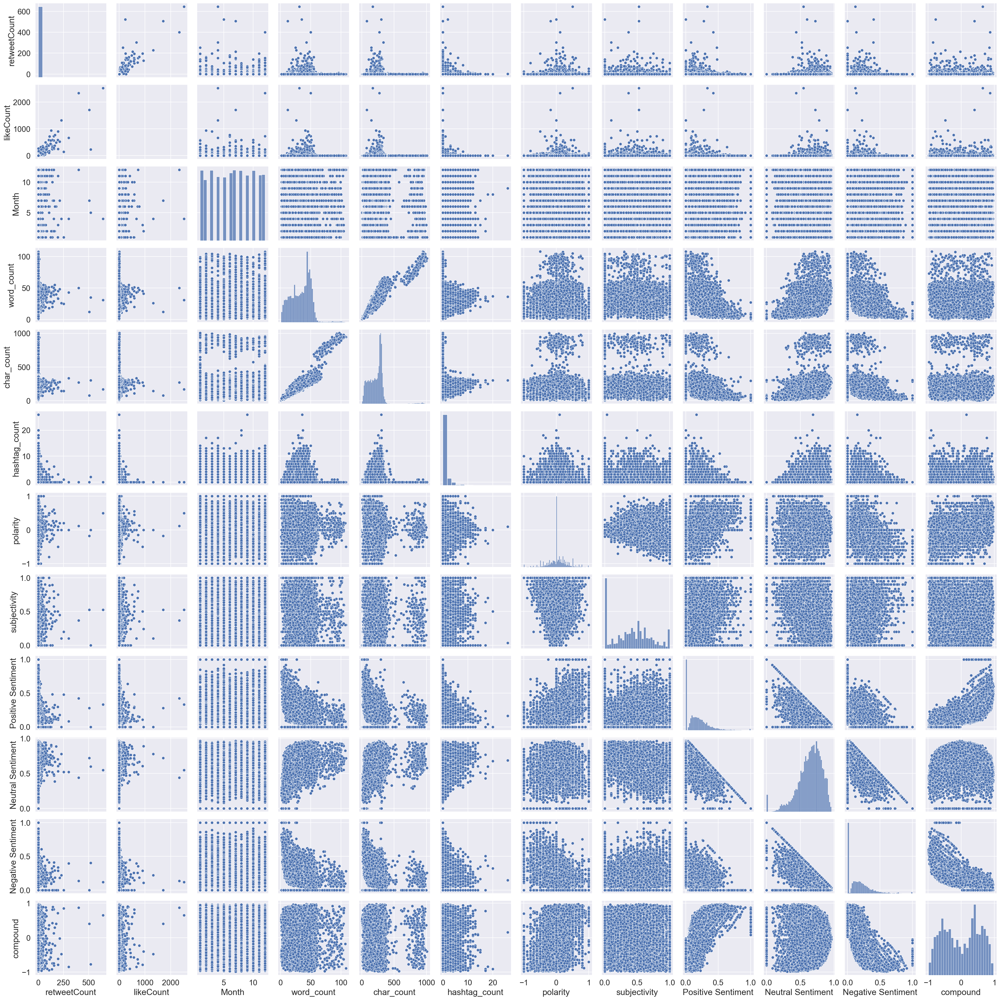

In [49]:
sns.pairplot(df_pair)

# Sentiment changes over time

<Figure size 1152x360 with 0 Axes>

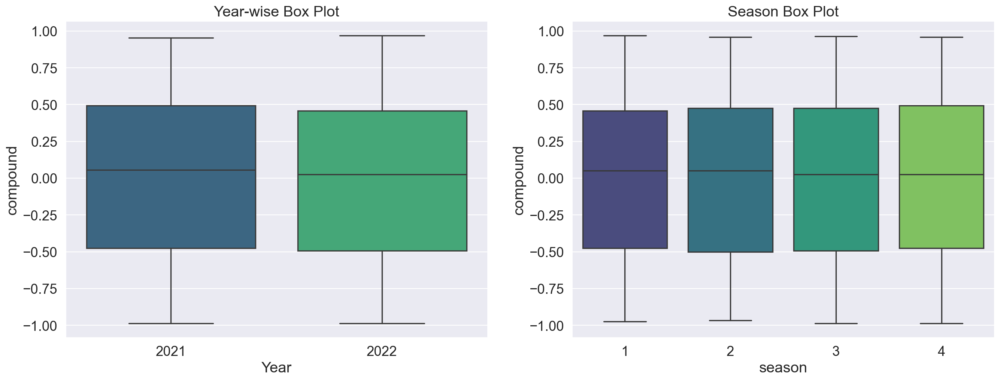

In [50]:
#call styles for plots
styles();
# Draw Plot
fig, axes = plt.subplots(1, 2, figsize=(20,7), dpi= 80)
sns.boxplot(x='Year', y='compound', data=filtered_df, ax=axes[0], palette='viridis')
sns.boxplot(x='season', y='compound', data=filtered_df, ax=axes[1] , palette='viridis' )


# Set Title
axes[0].set_title('Year-wise Box Plot', fontsize=18); 
axes[1].set_title('Season Box Plot', fontsize=18)


plt.show()

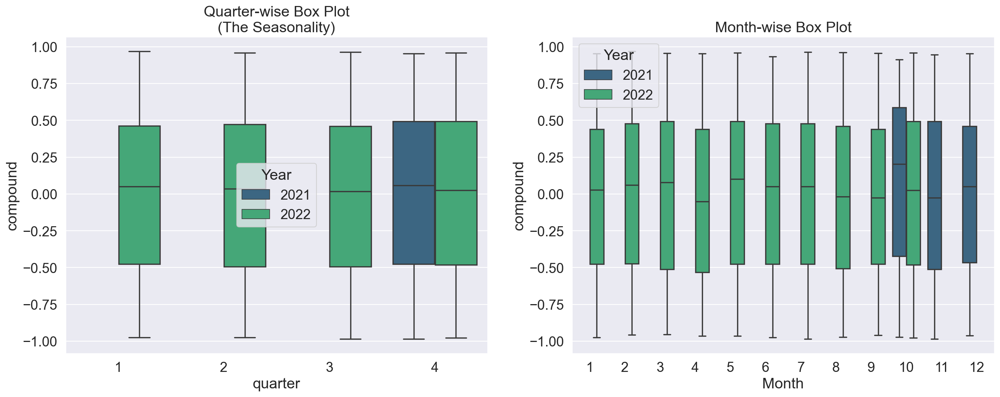

In [51]:
# Draw Plot
fig, axes = plt.subplots(1, 2, figsize=(20,7), dpi= 80)


sns.boxplot(x='quarter', y='compound', data=filtered_df, ax=axes[0] , palette='viridis', hue="Year")
sns.boxplot(x='Month', y='compound', data=filtered_df, ax=axes[1], palette='viridis', hue="Year");


# Set Title
axes[0].set_title('Quarter-wise Box Plot\n(The Seasonality)', fontsize=18)
axes[1].set_title('Month-wise Box Plot', fontsize=18); 


plt.show();

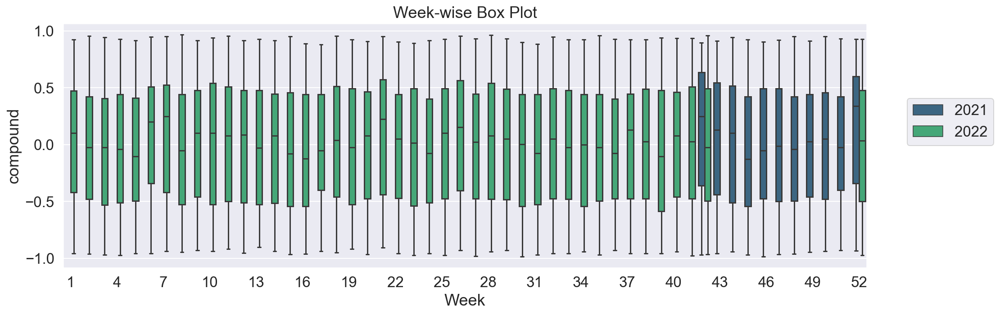

In [52]:
# Draw Plot

styles()

ax = sns.boxplot(x='Week', y='compound', data=filtered_df, palette='viridis', hue="Year");


#styling
temp = ax.xaxis.get_ticklabels()
#skip every 7th label, it was over crowded
temp = list(set(temp) - set(temp[::3]))
for label in temp:
    label.set_visible(False)

# Set Title
plt.title('Week-wise Box Plot', fontsize=18);

plt.legend(loc=(1.05, 0.5))
plt.show();

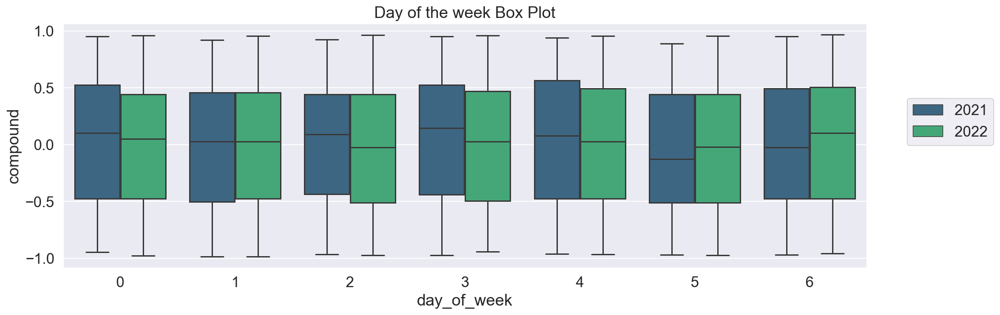

In [53]:
# Draw Plot
styles()
sns.boxplot(x='day_of_week', y='compound', data=filtered_df, palette='viridis', hue="Year");

# Set Title

plt.title('Day of the week Box Plot', fontsize=18); 

plt.legend(loc=(1.05, 0.5))

plt.show();

## Boris/Liz/Rishi

In [54]:
df_boris = filtered_df[filtered_df['tweet_clean'].str.contains("boris", case=False)]
#df_boris.describe()

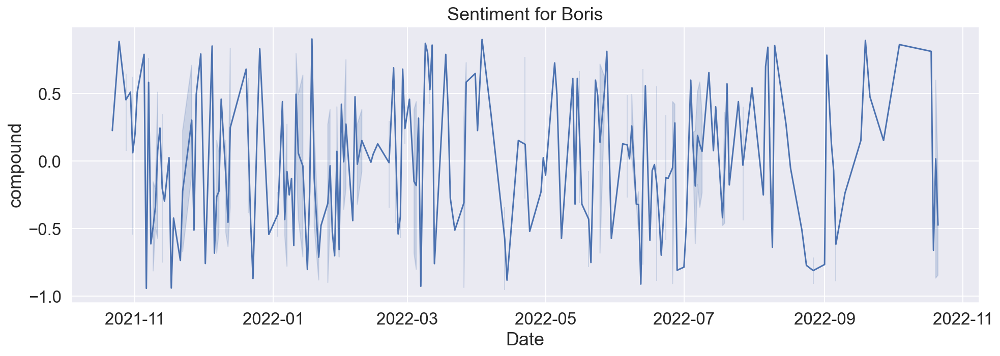

In [55]:
styles();

sns.lineplot(x=df_boris['Date'], y=df_boris['compound']);

plt.title("Sentiment for Boris");

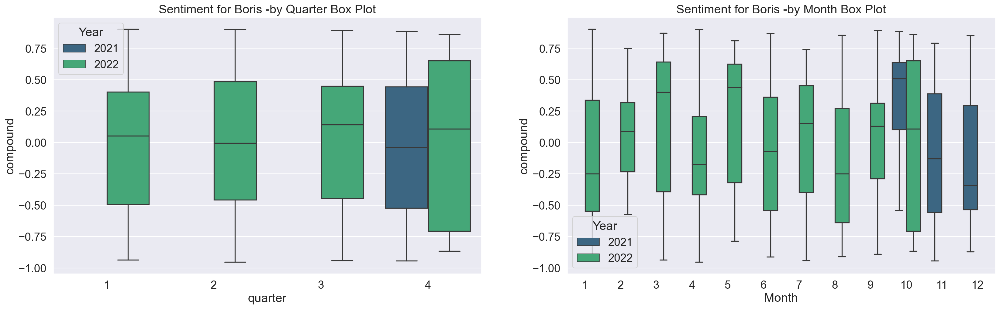

In [56]:
fig, axes = plt.subplots(1, 2, figsize=(25,7), dpi= 80)


sns.boxplot(x='quarter', y='compound', data=df_boris, ax=axes[0] , palette='viridis', hue="Year")
sns.boxplot(x='Month', y='compound', data=df_boris, ax=axes[1], palette='viridis', hue="Year");

# Set Title
axes[0].set_title('Sentiment for Boris -by Quarter Box Plot', fontsize=18);
axes[1].set_title('Sentiment for Boris -by Month Box Plot', fontsize=18);


plt.show();

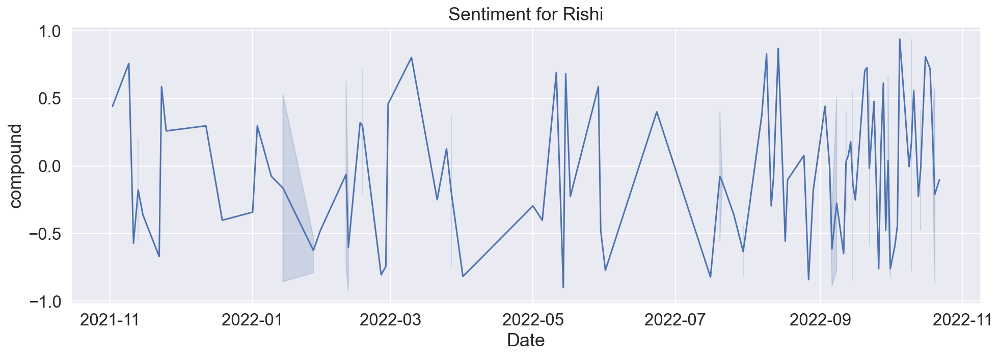

In [57]:
styles();
df_liz = filtered_df[filtered_df['tweet_clean'].str.contains("liz", case=False)]

sns.lineplot(x=df_liz['Date'], y=df_liz['compound']);


plt.title("Sentiment for Rishi");

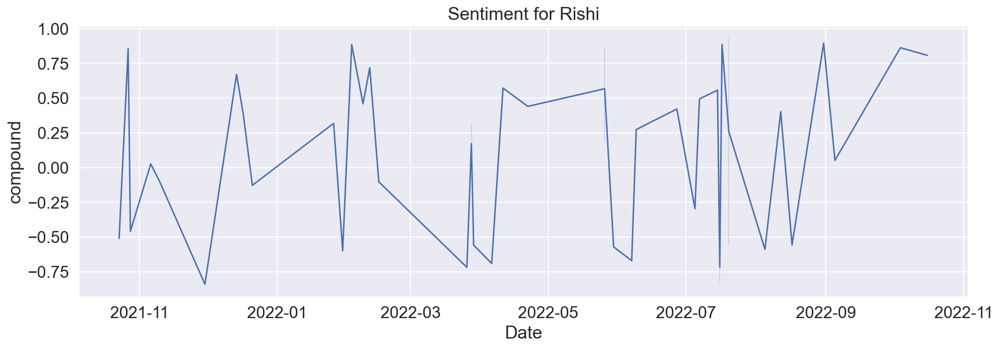

In [58]:
styles();
df_Rishi = filtered_df[filtered_df['tweet_clean'].str.contains("rishi", case=False)]

sns.lineplot(x=df_Rishi['Date'], y=df_Rishi['compound']);


plt.title("Sentiment for Rishi");

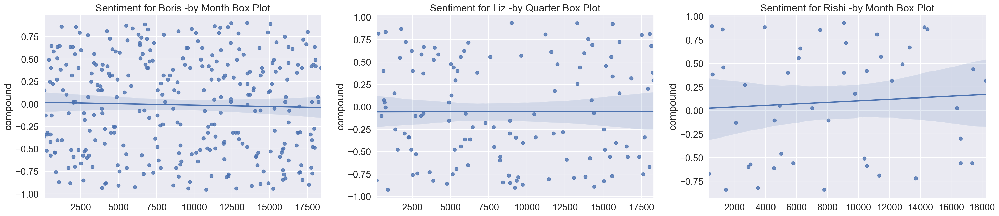

In [59]:
fig, axes = plt.subplots(1, 3, figsize=(30,6), dpi= 80);

sns.regplot(x=df_boris['Date'].index, y=df_boris['compound'],ax=axes[0])
sns.regplot(x=df_liz['Date'].index, y=df_liz['compound'],ax=axes[1])
sns.regplot(x=df_Rishi['Date'].index, y=df_Rishi['compound'],ax=axes[2])

axes[0].set_title('Sentiment for Boris -by Month Box Plot', fontsize=18);
axes[1].set_title('Sentiment for Liz -by Quarter Box Plot', fontsize=18);
axes[2].set_title('Sentiment for Rishi -by Month Box Plot', fontsize=18);


<Figure size 1152x360 with 0 Axes>

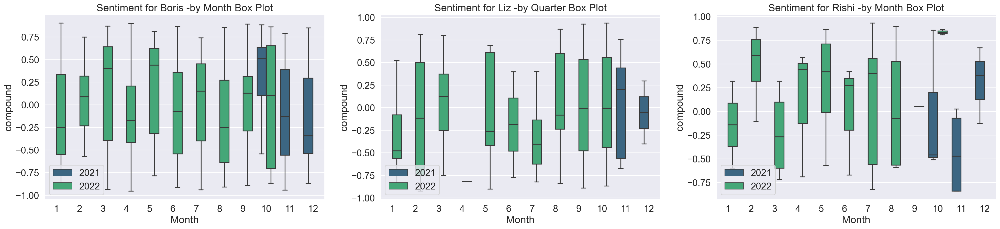

In [60]:
styles();

fig, axes = plt.subplots(1, 3, figsize=(30,6), dpi= 80);

sns.boxplot(x='Month', y='compound', data=df_boris, ax=axes[0], palette='viridis', hue="Year");
sns.boxplot(x='Month', y='compound', data=df_liz, ax=axes[1], palette='viridis', hue="Year");
sns.boxplot(x='Month', y='compound', data=df_Rishi, ax=axes[2], palette='viridis', hue="Year");
# Set Title

axes[0].set_title('Sentiment for Boris -by Month Box Plot', fontsize=18);
axes[1].set_title('Sentiment for Liz -by Quarter Box Plot', fontsize=18);
axes[2].set_title('Sentiment for Rishi -by Month Box Plot', fontsize=18);

axes[0].legend(loc='lower left');
axes[1].legend(loc='lower left');
axes[2].legend(loc='lower left');

plt.show();

## How to Check if Time Series Data is Stationary with Python
Test to check if the data is stationary or has a strong trend of seasonality

In [61]:
X = filtered_df.compound
split = round(len(X) / 2)
X1, X2 = X[0:split], X[split:]
mean1, mean2 = X1.mean(), X2.mean()
var1, var2 = X1.var(), X2.var()
print('mean1=%f, mean2=%f' % (mean1, mean2))
print('variance1=%f, variance2=%f' % (var1, var2))


mean1=0.001866, mean2=0.013187
variance1=0.288775, variance2=0.291844


In [62]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(X)
print('Augmented Dickey-Fuller test Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

Augmented Dickey-Fuller test Statistic: -88.920752
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567


Augmented Dickey-Fuller statistics is -88.920752. Therefore the null hypothesis is rejected. We have a **stationary** dataset.

# Average Sentiment

In [284]:
df_new=filtered_df[['Date', 'compound']]
df_new.sort_values(by='Date', inplace=True)

df_new["Date"]= pd.to_datetime(df_new["Date"])

compound_avg = df_new.resample('D', on='Date').mean()
compound_week = df_new.resample('W', on='Date').mean()
compound_month = df_new.resample('M', on='Date').mean()

compound_avg.rename(columns={'compound': 'compound_daily'}, inplace=True)
compound_week.rename(columns={'compound': 'compound_week'}, inplace=True)
compound_month.rename(columns={'compound': 'compound_month'}, inplace=True)

In [285]:
compound_avg

,compound_daily
Date,
2021-10-22,0.139872
2021-10-23,0.087707
2021-10-24,0.166876
2021-10-25,0.165766
2021-10-26,0.062952
...,...
2022-10-18,-0.049167
2022-10-19,0.055962
2022-10-20,0.081007


In [286]:
#df_new['day'] = df_new.index.apply(lambda x: x.Date()) 
#davg.reset_index('Date/Time', inplace=True)

df_cmpd_avg = pd.merge(df_new, compound_avg, on='Date')
#df_cmpd_2 = pd.merge(df_cmpd_avg , compound_week,left_by="Date")
#df_cmpd_avg = pd.merge(df_cmpd_avg , compound_month, left_on='Date',right_on='Date')

#df_cmpd_avg

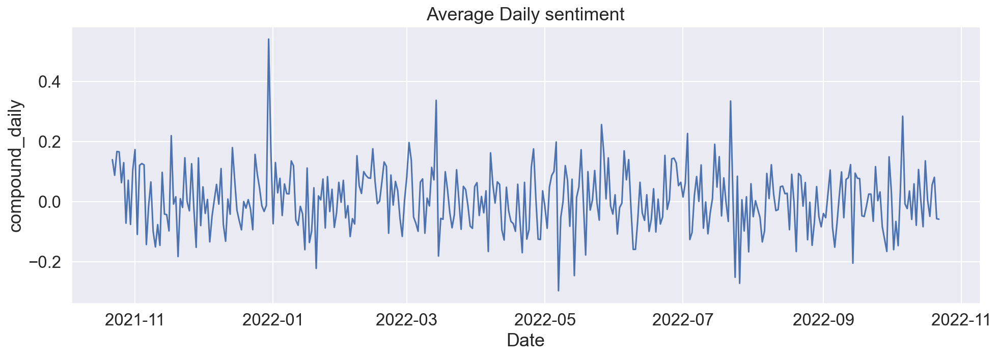

In [287]:
styles();

sns.lineplot(x=df_cmpd_avg['Date'], y=df_cmpd_avg['compound_daily']);

plt.title("Average Daily sentiment");

## Autocorrelation plots

Using pearson correlation between a series and its shifted self

In [288]:
series = df_cmpd_avg['compound_daily']

shift_1 = series.autocorr(lag=1)
print(shift_1)

0.976043571117154


It appears to be highly correlated

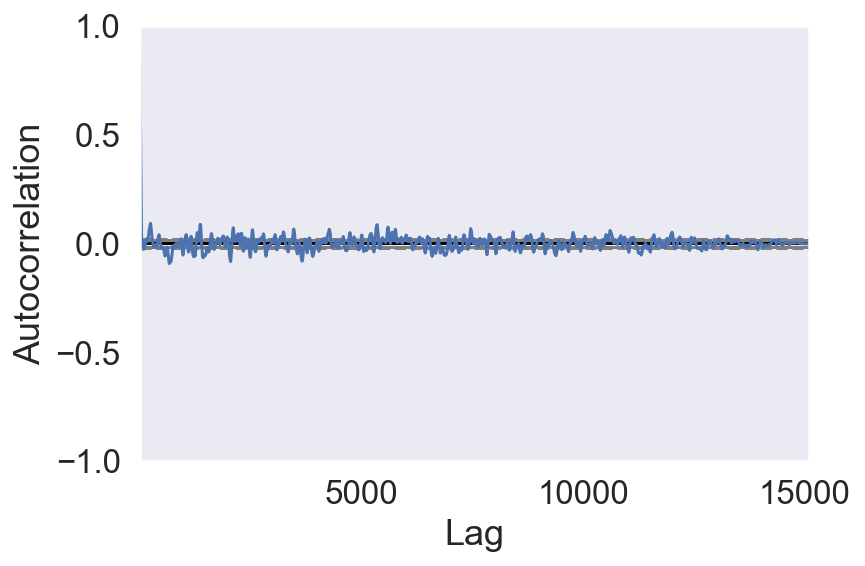

In [289]:
# Creating Autocorrelation plot
pd.plotting.autocorrelation_plot(series)
 
plt.show()

<Figure size 1152x360 with 0 Axes>

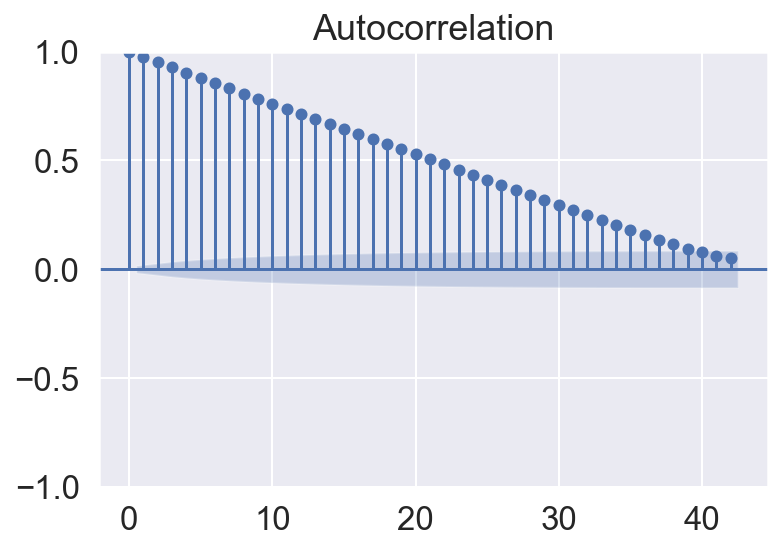

In [290]:
styles()
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(series)
plt.show()

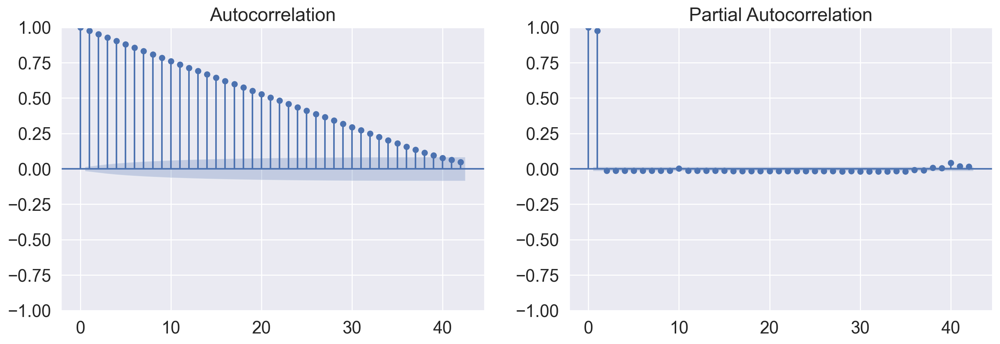

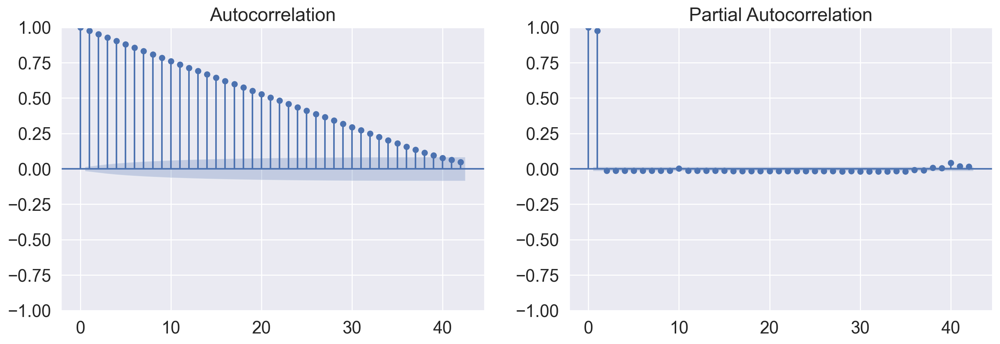

In [291]:
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, axes = plt.subplots(1,2,figsize=(16,5), dpi= 100)

plot_acf(series,  ax=axes[0])
plot_pacf(series,ax=axes[1])

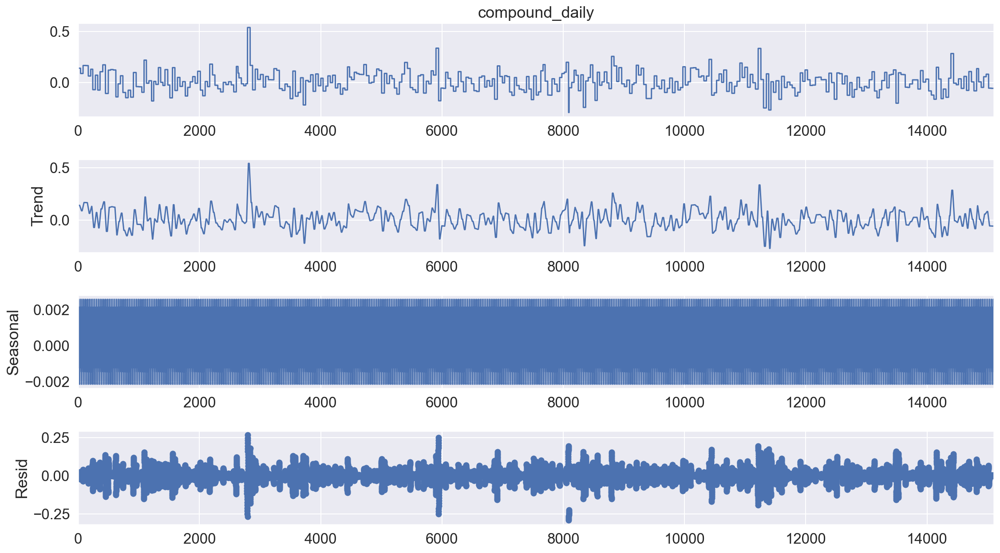

In [292]:
from random import randrange
from pandas import Series
from matplotlib import pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose


seasonal = seasonal_decompose(series, model='additive', period=30)

fig = seasonal.plot();
fig.set_size_inches((16, 9))
# Tight layout to realign things
fig.tight_layout()
plt.show()

In [293]:
from statsmodels.tsa.arima.model import ARIMA
steps = 30 # 30 days

train = series[:-steps]
ma_model = ARIMA(train).fit()

print(ma_model.summary())

                               SARIMAX Results                                
Dep. Variable:         compound_daily   No. Observations:                15072
Model:                          ARIMA   Log Likelihood               13015.574
Date:                Sat, 05 Nov 2022   AIC                         -26027.148
Time:                        14:24:26   BIC                         -26011.907
Sample:                             0   HQIC                        -26022.092
                              - 15072                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0077      0.001      8.900      0.000       0.006       0.009
sigma2         0.0104   8.88e-05    117.198      0.000       0.010       0.011
Ljung-Box (L1) (Q):               14358.78   Jarque-

In [294]:
#pip install skforecast
#pip install xgboost

# Modeling and Forecasting

In [295]:
# ==============================================================================
import xgboost as xgb
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from lightgbm import LGBMRegressor

from skforecast.ForecasterAutoreg import ForecasterAutoreg
from skforecast.ForecasterAutoregCustom import ForecasterAutoregCustom
from skforecast.ForecasterAutoregMultiOutput import ForecasterAutoregMultiOutput
from skforecast.model_selection import grid_search_forecaster
from skforecast.model_selection import backtesting_forecaster

from joblib import dump, load

# Warnings configuration
# ==============================================================================
import warnings
# warnings.filterwarnings('ignore')

In [296]:
type(df_cmpd_avg)

pandas.core.frame.DataFrame

In [297]:
df_cmpd_avg

,Date,compound,compound_daily
0,2021-10-22,0.6705,0.139872
1,2021-10-22,-0.6705,0.139872
2,2021-10-22,0.6124,0.139872
3,2021-10-22,-0.5994,0.139872
4,2021-10-22,-0.4588,0.139872
...,...,...,...
15097,2022-10-22,-0.7351,-0.058496
15098,2022-10-22,-0.6369,-0.058496
15099,2022-10-22,-0.5719,-0.058496
15100,2022-10-22,-0.3818,-0.058496


In [298]:
df_cmpd_avg['Date'].min()
df_cmpd_avg['Date'].max()

Timestamp('2022-10-22 00:00:00')

In [299]:
compound_avg.reset_index('Date', inplace=True)

In [300]:
compound_avg

,Date,compound_daily
0,2021-10-22,0.139872
1,2021-10-23,0.087707
2,2021-10-24,0.166876
3,2021-10-25,0.165766
4,2021-10-26,0.062952
...,...,...
361,2022-10-18,-0.049167
362,2022-10-19,0.055962
363,2022-10-20,0.081007
364,2022-10-21,-0.056988


In [301]:
compound_avg['Date'] = pd.to_datetime(compound_avg['Date'], format='%Y/%m/%d')
compound_avg = compound_avg.set_index('Date')
compound_avg = compound_avg.asfreq('D')

In [302]:
#df_cmp = compound_avg.asfreq('D')
df_cmp = compound_avg.sort_index()

In [303]:
df_cmp

,compound_daily
Date,
2021-10-22,0.139872
2021-10-23,0.087707
2021-10-24,0.166876
2021-10-25,0.165766
2021-10-26,0.062952
...,...
2022-10-18,-0.049167
2022-10-19,0.055962
2022-10-20,0.081007


In [304]:
df_file = '../dashboard/df_cmp.pkl'
pickle.dump(df_cmp, open(df_file, 'wb'))

Train dates : 2021-10-22 00:00:00 --- 2022-09-22 00:00:00  (n=336)
Test dates  : 2022-09-23 00:00:00 --- 2022-10-22 00:00:00  (n=30)


<Figure size 1152x360 with 0 Axes>

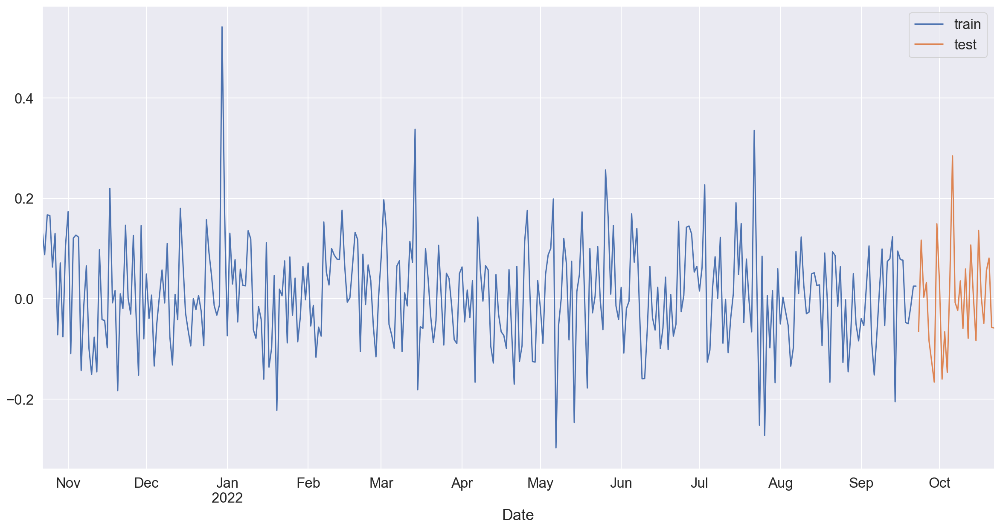

In [305]:

steps = 30 # 30 days
data_train = df_cmp[:-steps]
data_test  = df_cmp[-steps:]

print(f"Train dates : {data_train.index.min()} --- {data_train.index.max()}  (n={len(data_train)})")
print(f"Test dates  : {data_test.index.min()} --- {data_test.index.max()}  (n={len(data_test)})")

styles();

fig, ax=plt.subplots(figsize=(20, 10))
data_train['compound_daily'].plot(ax=ax, label='train')
data_test['compound_daily'].plot(ax=ax, label='test')


ax.legend();

In [306]:
data_train

,compound_daily
Date,
2021-10-22,0.139872
2021-10-23,0.087707
2021-10-24,0.166876
2021-10-25,0.165766
2021-10-26,0.062952
...,...
2022-09-18,-0.047352
2022-09-19,-0.049769
2022-09-20,-0.015188


### Random Forest Regressor

In [307]:
# Create and train forecaster
# ==============================================================================
forecaster = ForecasterAutoreg(
                regressor = RandomForestRegressor(random_state=123),
                lags = 1
                )

forecaster.fit(y=data_train['compound_daily'])
forecaster

ForecasterAutoreg 
Regressor: RandomForestRegressor(random_state=123) 
Lags: [1] 
Transformer for y: None 
Transformer for exog: None 
Window size: 1 
Included exogenous: False 
Type of exogenous variable: None 
Exogenous variables names: None 
Training range: [Timestamp('2021-10-22 00:00:00'), Timestamp('2022-09-22 00:00:00')] 
Training index type: DatetimeIndex 
Training index frequency: D 
Regressor parameters: {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 123, 'verbose': 0, 'warm_start': False} 
Creation date: 2022-11-05 14:24:27 
Last fit date: 2022-11-05 14:24:27 
Skforecast version: 0.5.1 
Python version: 3.9.6 

In [308]:
forecaster.get_feature_importance()

,feature,importance
0,lag_1,1.0


## Predictions

In [309]:
# Predictions
# ==============================================================================
steps = 30
predictions_rf = forecaster.predict(steps=steps)
predictions_rf.head(5)

2022-09-23    0.045793
2022-09-24   -0.145488
2022-09-25   -0.033227
2022-09-26    0.016556
2022-09-27   -0.160883
Freq: D, Name: pred, dtype: float64

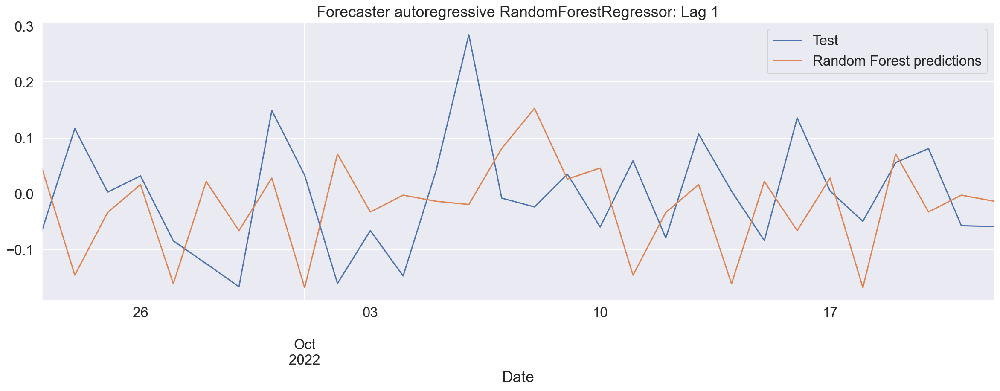

In [310]:
# Plot
# ==============================================================================
fig, ax = plt.subplots(figsize=(20, 6))
#data_train['compound_daily'].plot(ax=ax, label='train')
data_test['compound_daily'].plot(ax=ax, label='Test')
predictions_rf.plot(ax=ax, label='Random Forest predictions')
plt.title("Forecaster autoregressive RandomForestRegressor: Lag 1")
ax.legend();

In [317]:
y_actual

Date
2022-09-23   -0.065538
2022-09-24    0.116660
2022-09-25    0.002993
2022-09-26    0.032246
2022-09-27   -0.084064
2022-09-28   -0.124784
2022-09-29   -0.166113
2022-09-30    0.149213
2022-10-01    0.033368
2022-10-02   -0.160214
2022-10-03   -0.065875
2022-10-04   -0.146782
2022-10-05    0.041163
2022-10-06    0.284580
2022-10-07   -0.007584
2022-10-08   -0.023349
2022-10-09    0.035427
2022-10-10   -0.059404
2022-10-11    0.059212
2022-10-12   -0.078900
2022-10-13    0.107005
2022-10-14    0.004883
2022-10-15   -0.083527
2022-10-16    0.135867
2022-10-17    0.005137
2022-10-18   -0.049167
2022-10-19    0.055962
2022-10-20    0.081007
2022-10-21   -0.056988
2022-10-22   -0.058496
Freq: D, Name: compound_daily, dtype: float64

In [342]:
# Test error
# ==============================================================================

from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
import math 

y_actual = data_test['compound_daily']
y_pred = predictions_rf

#Mean Square Error
error_mse = mean_squared_error(y_actual,y_pred)

#Root Mean Square Error
rsme = math.sqrt(error_mse)  

mae = mean_absolute_error(y_actual,y_pred)

#Best possible score is 1.0
r2 = r2_score(y_actual,y_pred)

def mape(y, y_hat):
    return np.mean(np.abs((y - y_hat)/y)*100)

mape = mape(y_actual,y_pred)

# SMAPE proposed by Makridakis (1993): 0%-200%
def smape_original(a, f):
    return 1/len(a) * np.sum(2 * np.abs(f-a) / (np.abs(a) + np.abs(f))*100)

smape_o = smape_original(y_actual,y_pred)

# adjusted SMAPE version to scale metric from 0%-100%
def smape_adjusted(a, f):
    return (1/a.size * np.sum(np.abs(f-a) / (np.abs(a) + np.abs(f))*100))

smape_a = smape_adjusted(y_actual,y_pred)



print(f"Mean Square Error: {error_mse}")
print(f"Root Mean Square Error: {rsme}")

print(f"Mean Absolute Error: {mae}")


print(f"R2 coefficient of determination: {r2}")

print(f"Mean Absolute Percentage Error (MAPE): {mape}")

print(f"Symmetric Mean Absolute Percentage Error (SMAPE) original: {smape_o}")

print(f"Symmetric Mean Absolute Percentage Error (SMAPE) adjusted: {smape_a}")

Mean Square Error: 0.018677680181838734
Root Mean Square Error: 0.13666630960788667
Mean Absolute Error: 0.11341958331501698
mase: compound_daily    inf
dtype: float64
R2 coefficient of determination: -0.8841972832073881
Mean Absolute Percentage Error (MAPE): 348.52114637463427
Symmetric Mean Absolute Percentage Error (SMAPE) original: 155.04668517370578
Symmetric Mean Absolute Percentage Error (SMAPE) adjusted: 77.52334258685289


### XGBoost

XGBoost is a very efficient stochastic gradient boosting which is very popular for used. With it's own API and XGBRegressor class that follow scikit learn API make it compatible with skforecast.

In [323]:
# Create and train forecaster
# ==============================================================================
forecasterxgb = ForecasterAutoreg(
                regressor = xgb.XGBRegressor(random_state=123),
                lags = 1
                )

forecasterxgb.fit(y=data_train['compound_daily'])
forecasterxgb

model_file = '../dashboard/forecasterxgb.pkl'
pickle.dump(forecasterxgb, open(model_file, 'wb'))


In [324]:
import joblib

joblib.dump(forecasterxgb, "../dashboard/forecasterxgb.sav")

['../dashboard/forecasterxgb.sav']

In [325]:
forecasterxgb.get_feature_importance()

,feature,importance
0,lag_1,1.0


In [326]:
# Predictions
# ==============================================================================
steps = 30
predictions_XGB = forecasterxgb.predict(steps=steps)
predictions_XGB.head(5)

2022-09-23    0.016849
2022-09-24   -0.032727
2022-09-25   -0.010944
2022-09-26    0.075541
2022-09-27   -0.090531
Freq: D, Name: pred, dtype: float64

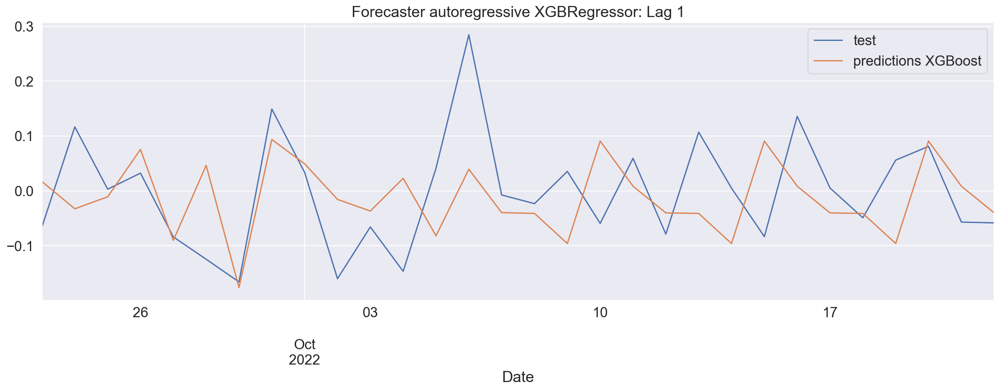

In [327]:
# Plot
# ==============================================================================
fig, ax = plt.subplots(figsize=(20, 6))
#data_train['compound_daily'].plot(ax=ax, label='train')
data_test['compound_daily'].plot(ax=ax, label='test')
predictions_XGB.plot(ax=ax, label='predictions XGBoost')
plt.title("Forecaster autoregressive XGBRegressor: Lag 1")
ax.legend();

In [339]:
# Test error
# ==============================================================================

from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
import math 

y_actual = data_test['compound_daily']
y_pred = predictions_XGB

#Mean Square Error
error_mse = mean_squared_error(y_actual,y_pred)

#Root Mean Square Error
rsme = math.sqrt(error_mse)  

#Best possible score is 1.0
r2 = r2_score(y_actual,y_pred)

mae = mean_absolute_error(y_actual,y_pred)

def mape(y, y_hat):
    return np.mean(np.abs((y - y_hat)/y)*100)

mape = mape(y_actual,y_pred)

# SMAPE proposed by Makridakis (1993): 0%-200%
def smape_original(a, f):
    return 1/len(a) * np.sum(2 * np.abs(f-a) / (np.abs(a) + np.abs(f))*100)

smape_o = smape_original(y_actual,y_pred)

# adjusted SMAPE version to scale metric from 0%-100%
def smape_adjusted(a, f):
    return (1/a.size * np.sum(np.abs(f-a) / (np.abs(a) + np.abs(f))*100))

smape_a = smape_adjusted(y_actual,y_pred)

print(f"Mean Square Error: {error_mse}")
print(f"Root Mean Square Error: {rsme}")
print(f"Mean Absolute Error: {mae}")
print(f"R2 coefficient of determination: {r2}")

print(f"Mean Absolute Percentage Error (MAPE): {mape}")

print(f"Symmetric Mean Absolute Percentage Error (SMAPE) original: {smape_o}")

print(f"Symmetric Mean Absolute Percentage Error (SMAPE) adjusted: {smape_a}")

Mean Square Error: 0.011458480099294984
Root Mean Square Error: 0.1070442903628913
Mean Absolute Error: 0.08436208021015286
R2 coefficient of determination: -0.1559271206373174
Mean Absolute Percentage Error (MAPE): 227.388320793799
Symmetric Mean Absolute Percentage Error (SMAPE) original: 133.2942196350492
Symmetric Mean Absolute Percentage Error (SMAPE) adjusted: 66.6471098175246


# 1 week prediction

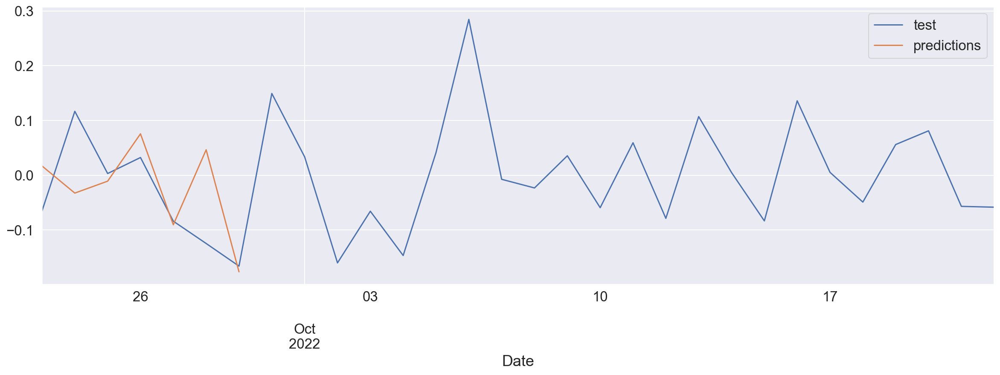

In [243]:
# Predictions
# ==============================================================================
steps = 7 # 7 days 
predictions = forecasterxgb.predict(steps=steps)
#predictions.head(5)

# Plot
# ==============================================================================
fig, ax = plt.subplots(figsize=(20, 6))
#data_train['compound_daily'].plot(ax=ax, label='train')
data_test['compound_daily'].plot(ax=ax, label='test')
predictions.plot(ax=ax, label='predictions')
ax.legend();

## 1 month prediction

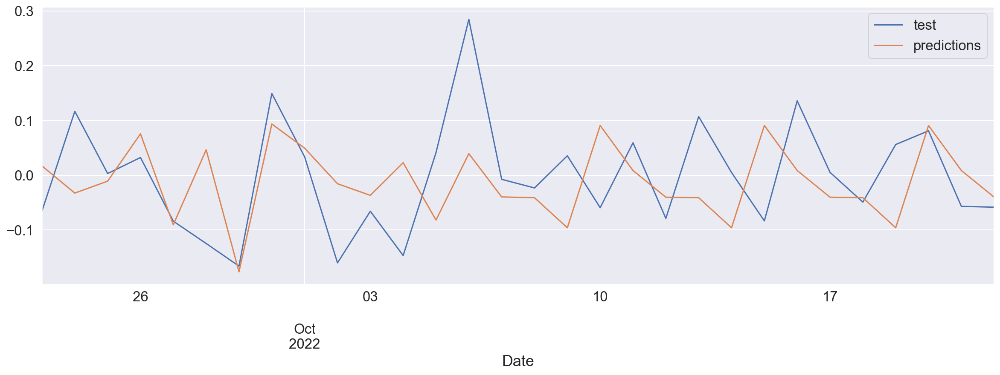

In [244]:
# Predictions
# ==============================================================================
steps = 30
predictions = forecasterxgb.predict(steps=steps)
#predictions.head(5)

# Plot
# ==============================================================================
fig, ax = plt.subplots(figsize=(20, 6))
#data_train['compound_daily'].plot(ax=ax, label='train')
data_test['compound_daily'].plot(ax=ax, label='test')
predictions.plot(ax=ax, label='predictions')
ax.legend();

## 3 months prediction

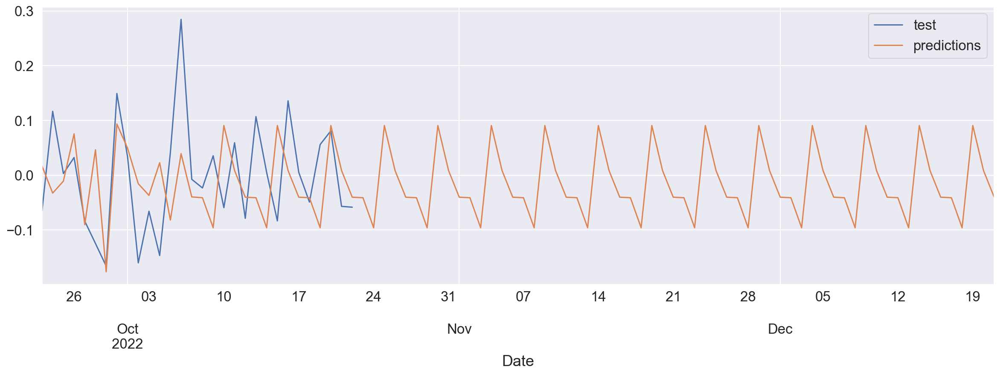

In [245]:
# Predictions
# ==============================================================================
steps = 90 # 90 days going forward
predictions = forecasterxgb.predict(steps=steps)
#predictions.head(5)

# Plot
# ==============================================================================
fig, ax = plt.subplots(figsize=(20, 6))
#data_train['compound_daily'].plot(ax=ax, label='train')
data_test['compound_daily'].plot(ax=ax, label='test')
predictions.plot(ax=ax, label='predictions')
ax.legend();

## Hyperparameter tuning for XGBoost

In [246]:
# Grid search of hyperparameters and lags

forecasterxgb2 = ForecasterAutoreg(
                regressor = xgb.XGBRegressor(random_state=123),
                lags = 1
                )

# Regressor hyperparameters
param_grid = {
    'n_estimators': [100, 500],
    'max_depth': [3, 5,6, 8, 10],
    'learning_rate': [0.01, 0.1, 0.3]
    }

# # Lags used as predictors
lags_grid = [1, 3, 6, 12, 24, 48, 72, [1, 2, 3, 6, 12,  23, 24, 25, 71, 72, 73]]

results_grid = grid_search_forecaster(
    forecaster         = forecasterxgb2,
    y                  = data_train['compound_daily'], # Train data
    param_grid         = param_grid,
    lags_grid          = lags_grid,
    steps              = 24, #24
    refit              = False,
    metric             = 'mean_squared_error',
    initial_train_size = int(len(data_train)*0.5), # Model is trained with training data
    fixed_train_size   = False,
    return_best        = True,
    verbose            = False
    )

Number of models compared: 240.


loop param_grid:  70%|█████████████████████████▏          | 21/30 [00:08<00:03,  2.56it/s]


loop param_grid:  40%|██████████████▍                     | 12/30 [00:06<00:09,  1.99it/s]


loop lags_grid: 100%|███████████████████████████████████████| 8/8 [01:33<00:00, 11.70s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [1 2 3] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 0.01052893091928099



In [247]:
results_grid.head(5)

,lags,params,mean_squared_error,learning_rate,max_depth,n_estimators
31,"[1, 2, 3]","{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",0.010529,0.01,3.0,500.0
97,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]","{'learning_rate': 0.01, 'max_depth': 8, 'n_est...",0.010698,0.01,8.0,500.0
104,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]","{'learning_rate': 0.1, 'max_depth': 6, 'n_esti...",0.010721,0.10,6.0,100.0
1,[1],"{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",0.010763,0.01,3.0,500.0
109,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",0.010842,0.10,10.0,500.0


In [248]:
# Predictors importance
# ==============================================================================
forecasterxgb2.get_feature_importance()

,feature,importance
0,lag_1,0.286356
1,lag_2,0.317492
2,lag_3,0.396152


In [249]:
# Create and train forecaster
# ==============================================================================
#forecasterxgb_new = ForecasterAutoreg(
#                regressor = xgb.XGBRegressor(max_depth=3, n_estimators=500, learning_rate=0.01, random_state=123),
#                lags =3
#                )

forecasterxgb2.fit(y=data_train['compound_daily'])
forecasterxgb2

ForecasterAutoreg 
Regressor: XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.01, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=500, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=123,
             reg_alpha=0, reg_lambda=1, ...) 
Lags: [1 2 3] 
Transformer for y: None 
Transformer for exog: None 
Window size: 3 
Included exogenous: False 
Type of exogenous variable: None 
Exogenous variables names: None 
Training range: [Timestamp('2021-10-22 00:00:00'), Timestamp('2022-09-22 00:00:00')] 
Training index type: 

In [250]:
# Predictions
# ==============================================================================
steps = 30
predictions_xgb_lag3 = forecasterxgb2.predict(steps=steps)
predictions_xgb_lag3.head(5)

2022-09-23    0.031194
2022-09-24    0.007350
2022-09-25    0.016237
2022-09-26    0.016156
2022-09-27    0.017331
Freq: D, Name: pred, dtype: float64

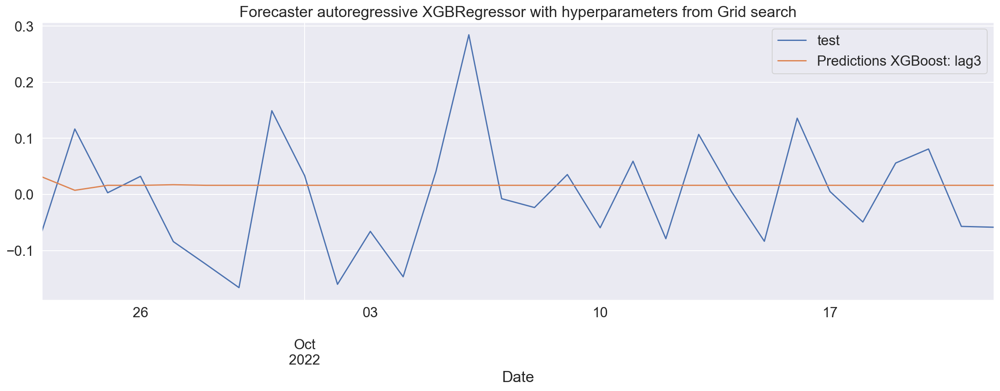

In [251]:
# Plot
# ==============================================================================
fig, ax = plt.subplots(figsize=(20, 6))
#data_train['compound_daily'].plot(ax=ax, label='train')
data_test['compound_daily'].plot(ax=ax, label='test')
predictions_xgb_lag3.plot(ax=ax, label='Predictions XGBoost: lag3')
plt.title("Forecaster autoregressive XGBRegressor with hyperparameters from Grid search")
ax.legend();

In [338]:
# Test error
# ==============================================================================

from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
import math 

y_actual = data_test['compound_daily']
y_pred = predictions_xgb_lag3

#Mean Square Error
error_mse = mean_squared_error(y_actual,y_pred)

#Root Mean Square Error
rsme = math.sqrt(error_mse)  

mae = mean_absolute_error(y_actual,y_pred)

#Best possible score is 1.0
r2 = r2_score(y_actual,y_pred)

def mape(y, y_hat):
    return np.mean(np.abs((y - y_hat)/y)*100)

mape = mape(y_actual,y_pred)

# SMAPE proposed by Makridakis (1993): 0%-200%
def smape_original(a, f):
    return 1/len(a) * np.sum(2 * np.abs(f-a) / (np.abs(a) + np.abs(f))*100)

smape_o = smape_original(y_actual,y_pred)

# adjusted SMAPE version to scale metric from 0%-100%
def smape_adjusted(a, f):
    return (1/a.size * np.sum(np.abs(f-a) / (np.abs(a) + np.abs(f))*100))

smape_a = smape_adjusted(y_actual,y_pred)

print(f"Mean Square Error: {error_mse}")
print(f"MAE: {mae}")
print(f"Root Mean Square Error: {rsme}")
print(f"R2 coefficient of determination: {r2}")

print(f"Mean Absolute Percentage Error (MAPE): {mape}")

print(f"Symmetric Mean Absolute Percentage Error (SMAPE) original: {smape_o}")

print(f"Symmetric Mean Absolute Percentage Error (SMAPE) adjusted: {smape_a}")

Mean Square Error: 0.010436410653637715
MAE: 0.08239743732515392
Root Mean Square Error: 0.10215875221261131
R2 coefficient of determination: -0.05282114312790265
Mean Absolute Percentage Error (MAPE): 128.58863749690346
Symmetric Mean Absolute Percentage Error (SMAPE) original: 160.7674639255785
Symmetric Mean Absolute Percentage Error (SMAPE) adjusted: 80.38373196278926


## random_search_forecaster

In [201]:
# Random search hyperparameter and lags
# ==============================================================================

from skforecast.model_selection import  random_search_forecaster


forecasterxgb3 = ForecasterAutoreg(
                regressor = xgb.XGBRegressor(random_state=123),
                lags = 6
                )

# Regressor hyperparameters
param_grid = {
    'n_estimators': [100, 500],
    'max_depth': [3, 5,6, 8, 10],
    'learning_rate': [0.01, 0.1, 0.3]
    }

# # Lags used as predictors
lags_grid = [1, 3, 6, 12, 24, 48, 72, [1, 2, 3, 6, 12,  23, 24, 25, 71, 72, 73]]

results = random_search_forecaster(
              forecaster           = forecasterxgb3,
              y                    = data_train['compound_daily'],
              steps                = 12,
              lags_grid            = lags_grid,
              param_distributions  = param_grid,
              n_iter               = 5,
              metric               = 'mean_squared_error',
              refit                = True,
              initial_train_size   = int(len(data_train)*0.5),
              fixed_train_size     = False,
              return_best          = True,
              random_state         = 123,
              verbose              = False
          )

results


Number of models compared: 40.


loop lags_grid: 100%|███████████████████████████████████████| 8/8 [02:13<00:00, 16.63s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12] 
  Parameters: {'n_estimators': 500, 'max_depth': 6, 'learning_rate': 0.01}
  Backtesting metric: 0.011284806528986484



,lags,params,mean_squared_error,n_estimators,max_depth,learning_rate
17,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]","{'n_estimators': 500, 'max_depth': 6, 'learnin...",0.011285,500.0,6.0,0.01
2,[1],"{'n_estimators': 500, 'max_depth': 6, 'learnin...",0.011287,500.0,6.0,0.01
15,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]","{'n_estimators': 500, 'max_depth': 8, 'learnin...",0.011314,500.0,8.0,0.01
5,"[1, 2, 3]","{'n_estimators': 500, 'max_depth': 8, 'learnin...",0.011404,500.0,8.0,0.01
7,"[1, 2, 3]","{'n_estimators': 500, 'max_depth': 6, 'learnin...",0.011435,500.0,6.0,0.01
20,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'n_estimators': 500, 'max_depth': 8, 'learnin...",0.012011,500.0,8.0,0.01
0,[1],"{'n_estimators': 500, 'max_depth': 8, 'learnin...",0.012142,500.0,8.0,0.01
32,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'n_estimators': 500, 'max_depth': 6, 'learnin...",0.012160,500.0,6.0,0.01
12,"[1, 2, 3, 4, 5, 6]","{'n_estimators': 500, 'max_depth': 6, 'learnin...",0.012210,500.0,6.0,0.01
30,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'n_estimators': 500, 'max_depth': 8, 'learnin...",0.012323,500.0,8.0,0.01


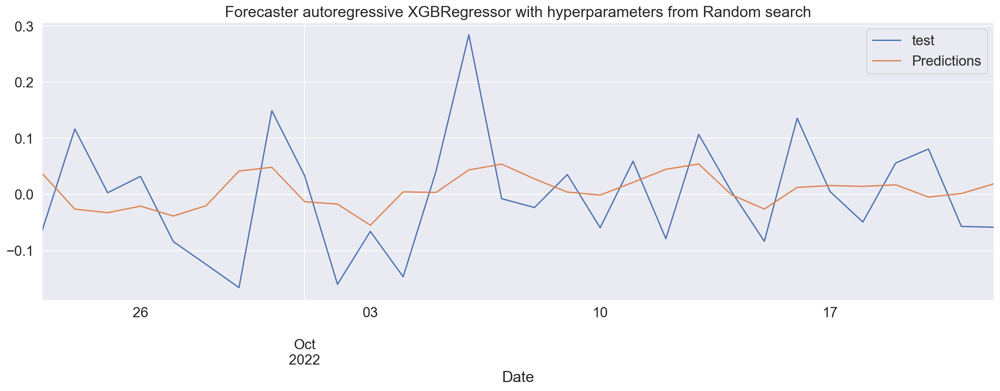

In [280]:
# Predictions
# ==============================================================================
steps = 30
predictions_randomsearch = forecasterxgb3.predict(steps=steps)
# Plot
# ==============================================================================
fig, ax = plt.subplots(figsize=(20, 6))
#data_train['compound_daily'].plot(ax=ax, label='train')
data_test['compound_daily'].plot(ax=ax, label='test')
predictions_randomsearch.plot(ax=ax, label='Predictions')
plt.title("Forecaster autoregressive XGBRegressor with hyperparameters from Random search")
ax.legend();

In [337]:
# Test error
# ==============================================================================

from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
import math 

y_actual = data_test['compound_daily']
y_pred = predictions_randomsearch

#Mean Square Error
error_mse = mean_squared_error(y_actual,y_pred)

#Root Mean Square Error
rsme = math.sqrt(error_mse)  

#Best possible score is 1.0
r2 = r2_score(y_actual,y_pred)

mae = mean_absolute_error(y_actual,y_pred)

def mape(y, y_hat):
    return np.mean(np.abs((y - y_hat)/y)*100)

mape = mape(y_actual,y_pred)

# SMAPE proposed by Makridakis (1993): 0%-200%
def smape_original(a, f):
    return 1/len(a) * np.sum(2 * np.abs(f-a) / (np.abs(a) + np.abs(f))*100)

smape_o = smape_original(y_actual,y_pred)

# adjusted SMAPE version to scale metric from 0%-100%
def smape_adjusted(a, f):
    return (1/a.size * np.sum(np.abs(f-a) / (np.abs(a) + np.abs(f))*100))

smape_a = smape_adjusted(y_actual,y_pred)

print(f"Mean Square Error: {error_mse}")
print(f"Root Mean Square Error: {rsme}")
print(f"Mean Absolute error: {mae}")
print(f"R2 coefficient of determination: {r2}")

print(f"Mean Absolute Percentage Error (MAPE): {mape}")

print(f"Symmetric Mean Absolute Percentage Error (SMAPE) original: {smape_o}")

print(f"Symmetric Mean Absolute Percentage Error (SMAPE) adjusted: {smape_a}")

Mean Square Error: 0.009262571381275193
Root Mean Square Error: 0.09624225361698048
Mean Absolute error: 0.07870816613387206
R2 coefficient of determination: 0.0655953168593606
Mean Absolute Percentage Error (MAPE): 166.49451756280828
Symmetric Mean Absolute Percentage Error (SMAPE) original: 160.11015246832912
Symmetric Mean Absolute Percentage Error (SMAPE) adjusted: 80.05507623416456


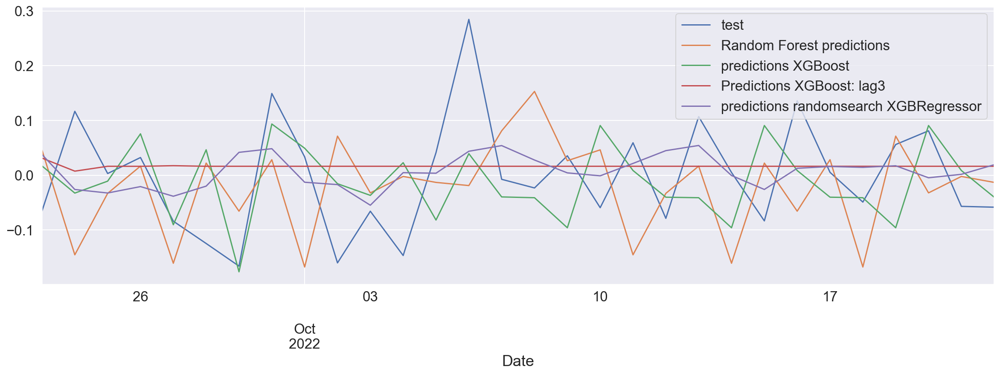

In [260]:
fig, ax = plt.subplots(figsize=(20, 6))
#data_train['compound_daily'].plot(ax=ax, label='train')
data_test['compound_daily'].plot(ax=ax, label='Test data')

predictions_rf.plot(ax=ax, label='Random Forest predictions')
predictions_XGB.plot(ax=ax, label='predictions XGBoost')
predictions_xgb_lag3.plot(ax=ax, label='Predictions XGBoost: lag3')
predictions_randomsearch.plot(ax=ax, label='predictions randomsearch XGBRegressor')


plt.title("")
ax.legend();

In [109]:
# Models to compare
# ==============================================================================
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import Ridge

models = [RandomForestRegressor(random_state=123), 
          GradientBoostingRegressor(random_state=123),
          Ridge(random_state=123)]

# param_grid for each model
param_grids = {'RandomForestRegressor': {'n_estimators': [50, 100], 'max_depth': [5, 15]},
               'GradientBoostingRegressor': {'n_estimators': [20, 50], 'max_depth': [5, 10]},
               'Ridge': {'alpha': [0.01, 0.1, 1]}}

# Lags used as predictors
lags_grid = [3, 5]


df_results = pd.DataFrame()
for i, model in enumerate(models):
    print(f"Grid search for regressor: {model}")
    print(f"-------------------------")

    forecaster = ForecasterAutoreg(
                     regressor = model,
                     lags      = 3
                 )

    # Regressor hyperparameters
    param_grid = param_grids[list(param_grids)[i]]

    results_grid = grid_search_forecaster(
                       forecaster         = forecaster,
                       y                  = data_train['compound_daily'],
                       param_grid         = param_grid,
                       lags_grid          = lags_grid,
                       steps              = 3,
                       refit              = True,
                       metric             = 'mean_squared_error',
                       initial_train_size = int(len(data_train)*0.5),
                       fixed_train_size   = True,
                       return_best        = False,
                       verbose            = False
                   )
    
    # Create a column with model name
    results_grid['model'] = list(param_grids)[i]
    
    df_results = pd.concat([df_results, results_grid])

df_results.sort_values(by='mean_squared_error')

Grid search for regressor: RandomForestRegressor(random_state=123)
-------------------------
Number of models compared: 8.


loop param_grid:   0%|                                              | 0/4 [00:00<?, ?it/s]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:  25%|█████████▌                            | 1/4 [00:04<00:12,  4.21s/it]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:  50%|███████████████████                   | 2/4 [00:12<00:12,  6.46s/it]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:  75%|████████████████████████████▌         | 3/4 [00:16<00:05,  5.55s/it]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:   0%|                                              | 0/4 [00:00<?, ?it/s]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:  25%|█████████▌                            | 1/4 [00:04<00:13,  4.35s/it]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:  50%|███████████████████                   | 2/4 [00:12<00:13,  6.69s/it]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:  75%|████████████████████████████▌         | 3/4 [00:17<00:05,  5.78s/it]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:51<00:00, 25.93s/it]


Grid search for regressor: GradientBoostingRegressor(random_state=123)
-------------------------
Number of models compared: 8.


loop param_grid:   0%|                                              | 0/4 [00:00<?, ?it/s]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:  25%|█████████▌                            | 1/4 [00:00<00:02,  1.34it/s]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:  50%|███████████████████                   | 2/4 [00:02<00:02,  1.15s/it]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:  75%|████████████████████████████▌         | 3/4 [00:03<00:01,  1.04s/it]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:   0%|                                              | 0/4 [00:00<?, ?it/s]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:  25%|█████████▌                            | 1/4 [00:00<00:02,  1.17it/s]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:  50%|███████████████████                   | 2/4 [00:02<00:02,  1.35s/it]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:  75%|████████████████████████████▌         | 3/4 [00:03<00:01,  1.25s/it]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:10<00:00,  5.44s/it]


Grid search for regressor: Ridge(random_state=123)
-------------------------
Number of models compared: 6.


loop param_grid:   0%|                                              | 0/3 [00:00<?, ?it/s]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:  33%|████████████▋                         | 1/3 [00:00<00:00,  3.45it/s]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:  67%|█████████████████████████▎            | 2/3 [00:00<00:00,  3.62it/s]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:   0%|                                              | 0/3 [00:00<?, ?it/s]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:  33%|████████████▋                         | 1/3 [00:00<00:00,  3.60it/s]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop param_grid:  67%|█████████████████████████▎            | 2/3 [00:00<00:00,  3.69it/s]

Forecaster will be fit 56 times. This can take substantial amounts of time. If not feasible, try with `refit = False`. 




loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:01<00:00,  1.21it/s]


,lags,params,mean_squared_error,max_depth,n_estimators,model,alpha
2,"[1, 2, 3]",{'alpha': 1},0.010767,NaN,NaN,Ridge,1.00
5,"[1, 2, 3, 4, 5]",{'alpha': 1},0.010852,NaN,NaN,Ridge,1.00
1,"[1, 2, 3]",{'alpha': 0.1},0.010911,NaN,NaN,Ridge,0.10
1,"[1, 2, 3]","{'max_depth': 5, 'n_estimators': 100}",0.010912,5.0,100.0,RandomForestRegressor,NaN
0,"[1, 2, 3]",{'alpha': 0.01},0.010935,NaN,NaN,Ridge,0.01
4,"[1, 2, 3, 4, 5]","{'max_depth': 5, 'n_estimators': 20}",0.011012,5.0,20.0,GradientBoostingRegressor,NaN
4,"[1, 2, 3, 4, 5]",{'alpha': 0.1},0.011078,NaN,NaN,Ridge,0.10
3,"[1, 2, 3, 4, 5]",{'alpha': 0.01},0.011117,NaN,NaN,Ridge,0.01
0,"[1, 2, 3]","{'max_depth': 5, 'n_estimators': 50}",0.011128,5.0,50.0,RandomForestRegressor,NaN
5,"[1, 2, 3, 4, 5]","{'max_depth': 5, 'n_estimators': 100}",0.011528,5.0,100.0,RandomForestRegressor,NaN


### Backtesting

In [261]:
# Backtesting
metric, predictions = backtesting_forecaster(
    forecaster = forecasterxgb,
    y          = data_train['compound_daily'],
    initial_train_size = 60,
    fixed_train_size   = False,
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False # Change to True to see detailed information
)

In [262]:
print(f"Backtest error: {metric}")

Backtest error: 0.020907235566980525


In [263]:
# Index is added to predictions
predictions

,pred
2021-12-21,0.143336
2021-12-22,-0.077615
2021-12-23,-0.143487
2021-12-24,-0.014292
2021-12-25,0.068291
...,...
2022-09-18,0.143336
2022-09-19,-0.077615
2022-09-20,-0.143487
2022-09-21,-0.014292


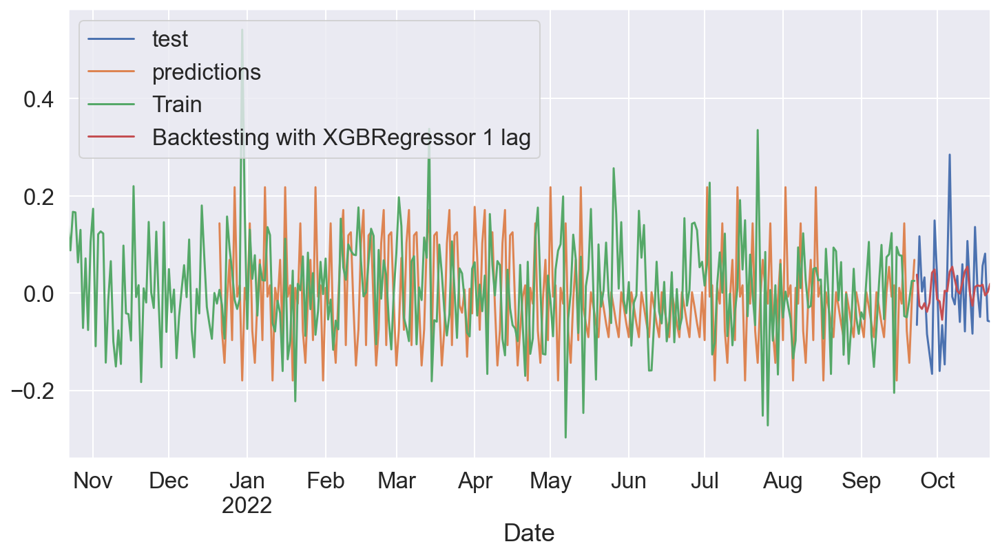

In [265]:
# Plot of predictions
fig, ax = plt.subplots(figsize=(12, 6))
data_test['compound_daily'].plot(ax=ax, label='test')
predictions['pred'].plot(ax=ax, label='predictions')
data_train['compound_daily'].plot(ax=ax, label='Train')
predictions_randomsearch.plot(ax=ax, label='Backtesting with XGBRegressor 1 lag')
ax.legend();

## LGBM Regressor

### LGBM Regressor using hypter parameters

In [272]:
# Grid search of hyperparameters and lags

forecasterLGBM = ForecasterAutoreg(
                regressor = LGBMRegressor(random_state=123),
                lags = 1
                )

# Regressor hyperparameters
param_grid = {
    'n_estimators': [50, 100, 500],
    'max_depth': [3, 5, 10],
    'learning_rate': [0.01, 0.1, 0.3, 0.5]
    }

# # Lags used as predictors
lags_grid = [24, 48, 72, [1, 2, 3,6, 12, 23, 24, 25, 71, 72, 73]]

results_grid = grid_search_forecaster(
    forecaster         = forecasterLGBM,
    y                  = data_train['compound_daily'], # Train data
    param_grid         = param_grid,
    lags_grid          = lags_grid,
    steps              = 24, #24
    refit              = False,
    metric             = 'mean_squared_error',
    initial_train_size = int(len(data_train)*0.5), # Model is trained with training data
    fixed_train_size   = False,
    return_best        = True,
    verbose            = False
    )

Number of models compared: 144.


loop lags_grid: 100%|███████████████████████████████████████| 4/4 [00:13<00:00,  3.45s/it]

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50}
  Backtesting metric: 0.010609206597159783



In [273]:
results_grid.head(5)

,lags,params,mean_squared_error,learning_rate,max_depth,n_estimators
0,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",0.010609,0.01,3.0,50.0
108,"[1, 2, 3, 6, 12, 23, 24, 25, 71, 72, 73]","{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",0.010742,0.01,3.0,50.0
114,"[1, 2, 3, 6, 12, 23, 24, 25, 71, 72, 73]","{'learning_rate': 0.01, 'max_depth': 10, 'n_es...",0.010742,0.01,10.0,50.0
111,"[1, 2, 3, 6, 12, 23, 24, 25, 71, 72, 73]","{'learning_rate': 0.01, 'max_depth': 5, 'n_est...",0.010742,0.01,5.0,50.0
3,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'learning_rate': 0.01, 'max_depth': 5, 'n_est...",0.010794,0.01,5.0,50.0


In [274]:
# Create and train forecaster
# ==============================================================================
#forecasterLGBM = ForecasterAutoreg(
#                regressor = LGBMRegressor(max_depth=3, n_estimators=50, learning_rate=0.01, random_state=123),
#                lags = 24
#               )

forecasterLGBM.fit(y=data_train['compound_daily'])
forecasterLGBM

ForecasterAutoreg 
Regressor: LGBMRegressor(learning_rate=0.01, max_depth=3, n_estimators=50,
              random_state=123) 
Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24] 
Transformer for y: None 
Transformer for exog: None 
Window size: 24 
Included exogenous: False 
Type of exogenous variable: None 
Exogenous variables names: None 
Training range: [Timestamp('2021-10-22 00:00:00'), Timestamp('2022-09-22 00:00:00')] 
Training index type: DatetimeIndex 
Training index frequency: D 
Regressor parameters: {'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0, 'importance_type': 'split', 'learning_rate': 0.01, 'max_depth': 3, 'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 50, 'n_jobs': -1, 'num_leaves': 31, 'objective': None, 'random_state': 123, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'silent': 'warn', 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0} 
Creation date: 2022-11-0

In [333]:
# Predictions
# ==============================================================================
steps = 30
predictions_LGBM = forecasterLGBM.predict(steps=steps)
predictions_LGBM.head(5)

2022-09-23    0.008765
2022-09-24   -0.007476
2022-09-25    0.016410
2022-09-26   -0.002956
2022-09-27    0.002517
Freq: D, Name: pred, dtype: float64

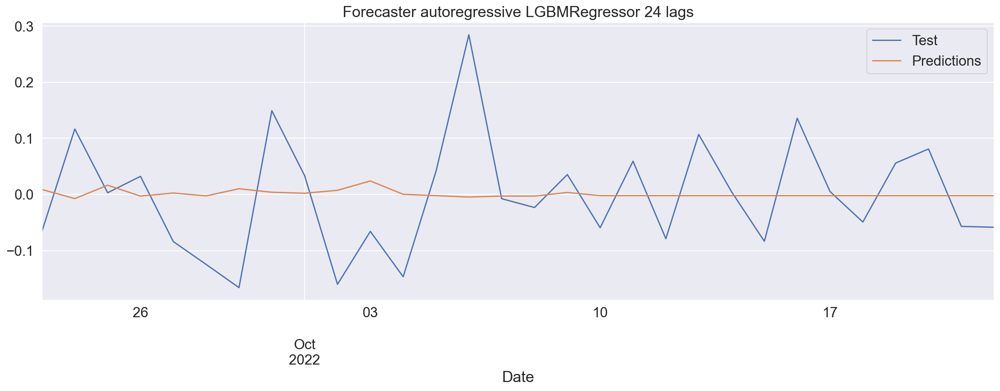

In [334]:
# Plot
# ==============================================================================
fig, ax = plt.subplots(figsize=(20, 6))
#data_train['compound_daily'].plot(ax=ax, label='train')
data_test['compound_daily'].plot(ax=ax, label='Test')
predictions_LGBM.plot(ax=ax, label='Predictions')
plt.title("Forecaster autoregressive LGBMRegressor 24 lags")
ax.legend();

In [336]:
# Test error
# ==============================================================================

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
import math 

y_actual = data_test['compound_daily']
y_pred = predictions_LGBM

#Mean Square Error
error_mse = mean_squared_error(y_actual,y_pred)

#Root Mean Square Error
rsme = math.sqrt(error_mse)  

#Best possible score is 1.0
r2 = r2_score(y_actual,y_pred)

mae = mean_absolute_error(y_actual,y_pred)

def mape(y, y_hat):
    return np.mean(np.abs((y - y_hat)/y)*100)

mape = mape(y_actual,y_pred)

# SMAPE proposed by Makridakis (1993): 0%-200%
def smape_original(a, f):
    return 1/len(a) * np.sum(2 * np.abs(f-a) / (np.abs(a) + np.abs(f))*100)

smape_o = smape_original(y_actual,y_pred)

# adjusted SMAPE version to scale metric from 0%-100%
def smape_adjusted(a, f):
    return (1/a.size * np.sum(np.abs(f-a) / (np.abs(a) + np.abs(f))*100))

smape_a = smape_adjusted(y_actual,y_pred)

print(f"Mean Square Error: {error_mse}")
print(f"Mean Absolute Error: {mae}")
print(f"Root Mean Square Error: {rsme}")
print(f"R2 coefficient of determination: {r2}")

print(f"Mean Absolute Percentage Error (MAPE): {mape}")

print(f"Symmetric Mean Absolute Percentage Error (SMAPE) original: {smape_o}")

print(f"Symmetric Mean Absolute Percentage Error (SMAPE) adjusted: {smape_a}")

Mean Square Error: 0.010401271237460317
Mean Absolute Error: 0.08134745565933478
Root Mean Square Error: 0.10198662283584214
R2 coefficient of determination: -0.049276292169413205
Mean Absolute Percentage Error (MAPE): 114.71779043065212
Symmetric Mean Absolute Percentage Error (SMAPE) original: 187.39844191963482
Symmetric Mean Absolute Percentage Error (SMAPE) adjusted: 93.69922095981741


In [ ]:
filtered_df.info()

#### Saving best model for later

In [ ]:
model_file = '../dashboard/forecasterxgb.pkl'
pickle.dump(forecasterxgb, open(model_file, 'wb'))

## Adding more features 

In [128]:
steps = 3600 
data_train = filtered_df[:-steps]
data_test  = filtered_df[-steps:]

features = ['Week',  'day_of_week', 'quarter', 'Month', 'word_count', 'char_count', 'retweetCount', 'likeCount']
target = 'compound'

X_train = data_train[features]
y_train = data_train[target]

X_test = data_test[features]
y_test = data_test[target]

In [129]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error

In [130]:
reg = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)

reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=100)

[12:21:45] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-cpython-37/xgboost/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.72615	validation_1-rmse:0.72814
[100]	validation_0-rmse:0.56460	validation_1-rmse:0.56897
[200]	validation_0-rmse:0.53819	validation_1-rmse:0.54409
[300]	validation_0-rmse:0.53369	validation_1-rmse:0.54064
[400]	validation_0-rmse:0.53241	validation_1-rmse:0.54026
[482]	validation_0-rmse:0.53174	validation_1-rmse:0.54027


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=50, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.01, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=1000,
             n_jobs=0, num_parallel_tree=1, objective='reg:linear',
             predictor='auto', random_state=0, reg_alpha=0, ...)

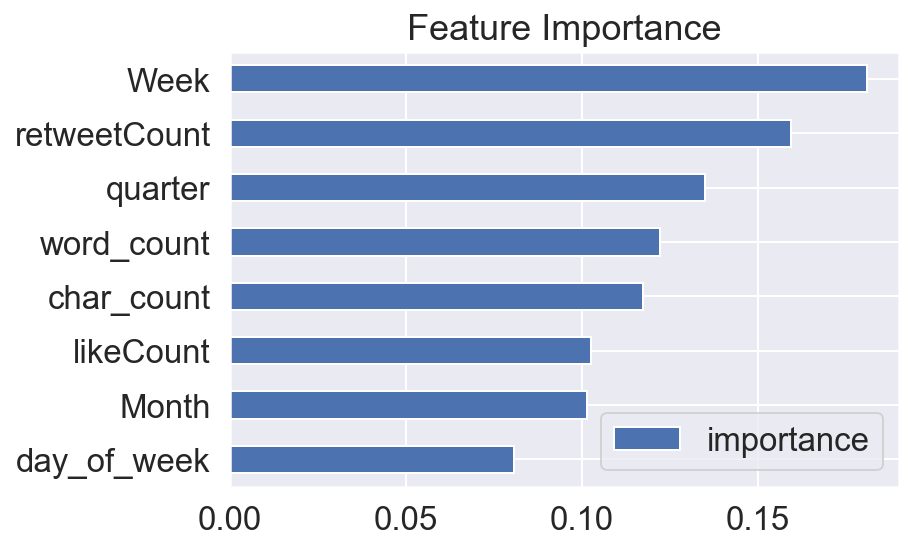

In [131]:
feature_importance = pd.DataFrame(data=reg.feature_importances_,
             index=reg.feature_names_in_,
             columns=['importance'])
feature_importance.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

In [132]:
pred_y = reg.predict(X_test)
pred_y 

array([ 0.02470592,  0.0277674 ,  0.04886731, ...,  0.01743237,
       -0.06799004,  0.03528681], dtype=float32)

In [133]:
#filtered_df.info()
data_test['prediction'] = pred_y 

In [134]:
data_test['prediction']

14041    0.024706
14042    0.027767
14043    0.048867
14045   -0.019693
14046    0.030807
           ...   
18475    0.009322
18476    0.019364
18477    0.017432
18478   -0.067990
18479    0.035287
Name: prediction, Length: 3600, dtype: float32

In [135]:
data_test

,Datetime,Tweet ID,Text,Username,retweetCount,likeCount,hashtags,Date,Month,Year,...,stopwords,hashtag_count,tweet_clean,polarity,subjectivity,Positive Sentiment,Neutral Sentiment,Negative Sentiment,compound,prediction
14041,2022-01-13 15:49:23+00:00,1481654618257977348,@danielgoyal JVT has been a fantastic communic...,LisaTho59303283,1,9,,2022-01-13,1,2022,...,19,0,jvt fantastic communicator everyone limits ukg...,0.331818,0.711364,0.261,0.528,0.211,0.4180,0.024706
14042,2022-01-15 20:09:35+00:00,1482444874309853186,@robertt_reidd @fatzdomingo @Scotpol1314 I'd l...,IssyMil,0,0,,2022-01-15,1,2022,...,19,0,id like see membership would mean scotlands pe...,-0.159722,0.629167,0.091,0.909,0.000,0.3612,0.027767
14043,2022-01-19 13:52:12+00:00,1483799457309372424,@EricSte38390001 @UyghurStop @Nus_Ghani @ukgov...,estelle_bevan,0,1,,2022-01-19,1,2022,...,21,0,definitely need exposed treatment tibetan peop...,0.000000,0.250000,0.209,0.559,0.232,-0.2023,0.048867
14045,2022-01-21 00:50:10+00:00,1484327427446738945,I just want him back to his best 😢 https://t.c...,FuckBoris_UKGov,0,1,,2022-01-21,1,2022,...,4,0,want back best 😢,0.500000,0.150000,0.846,0.154,0.000,0.6705,-0.019693
14046,2022-01-23 18:21:18+00:00,1485316726480949251,Get Kane the hell out of this useless club man...,FuckBoris_UKGov,0,0,,2022-01-23,1,2022,...,6,0,get kane hell useless club man wasted baller,-0.350000,0.100000,0.000,0.321,0.679,-0.8910,0.030807
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18475,2022-09-18 18:56:25+00:00,1571573875850317824,@Telegraph #UKGov's 'biggest transport operati...,MrLouisB22,0,1,"['UKGov', 'NotMyUK', 'IndependentScotland']",2022-09-18,9,2022,...,4,3,ukgovs biggest transport operationsince africa...,-0.055556,0.055556,0.000,0.830,0.170,-0.4715,0.009322
18476,2022-09-20 22:03:03+00:00,1572345621050437633,@PerthScot @SeparatistVegan @4everajambo @jhal...,WullieHalliday,0,0,,2022-09-20,9,2022,...,16,0,claim make verified ukgov ons reports entitled...,0.000000,0.000000,0.344,0.656,0.000,0.4939,0.019364
18477,2022-10-04 19:28:09+00:00,1577380068334178305,@SirRogerGale @peterjukes The standard of MPs ...,ConsueloMariaS,0,0,,2022-10-04,10,2022,...,3,0,standard mps making current ukgov distressing,0.000000,0.200000,0.000,0.649,0.351,-0.4019,0.017432
18478,2022-10-13 14:13:40+00:00,1580562417292955654,@GreenpeaceUK UKGov be like..... https://t.co/...,Dodge__Games,0,0,,2022-10-13,10,2022,...,1,0,ukgov like,0.000000,0.000000,0.714,0.286,0.000,0.3612,-0.067990


In [136]:
filtered_df_2 = filtered_df.merge(data_test[['prediction']], how='left', left_index=True, right_index=True)

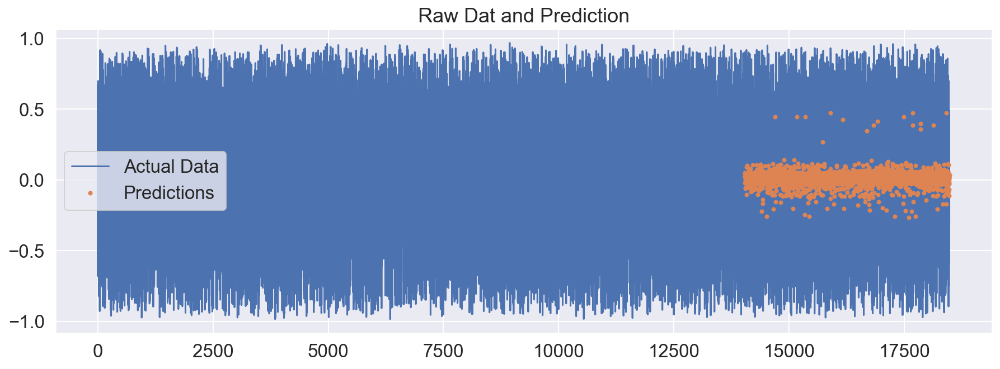

In [137]:
ax = filtered_df_2[['compound']].plot(figsize=(15, 5))
filtered_df_2['prediction'].plot(ax=ax, style='.')
plt.legend(['Actual Data', 'Predictions'])
ax.set_title('Raw Dat and Prediction')
plt.show()

In [138]:
import numpy as np
score = np.sqrt(mean_squared_error(data_test['compound'], data_test['prediction']))
print(f'RMSE Score on Test set: {score:0.2f}')

RMSE Score on Test set: 0.54


## Calculate Error

In [ ]:
data_test['error'] = np.abs(data_test[target] - data_test['prediction'])
data_test.groupby(['Date'])['error'].mean().sort_values(ascending=False).head(10)
#data_test['error'] 